# Proyecto 03 - Series de Tiempo

## Por: David Alejandro Salazar Paz

## Dataset: Flujo Vehicular por Unidades de Peaje AUSA

**Recuerda descargar el dataset de [aquí](https://data.buenosaires.gob.ar/dataset/flujo-vehicular-por-unidades-peaje-ausa). Deberás descargar -  al menos para comenzar - los años 2017, 2018 y 2019.**

En este notebook te dejamos unas celdas para que puedas comenzar a trabajar con este dataset para los años 2017, 2018 y 2019. Si deseas utilizar otros años, ten en cuenta que deberás hacer el preprocesamiento correspondiente, ya que la estructura de los datos puede variar.

**Importante:** Para el proyecto, debes comenzar con los datos de la autopista Illia, pago en Efectivo.

### Exploración de datos

Dedícale un buen tiempo a hacer un Análisis Exploratorio de Datos. Elige preguntas que creas que puedas responder con este dataset. Por ejemplo, ¿Cuáles son los días y horarios de mayor tráfico? También, estudia autocorrelaciones, resampleos, etc.

#### Componentes de la serie

1. Calcula las componentes estacionales y tendencia de la serie. Interpreta los resultados, si es necesario con información auxiliar (por fuera del dataset) o elementos del dataset que no estés utilizando (por ejemplo, si la tendencia es negativa, ¿puede ser porque se migre a otras formas de pago?).
1. ¿La serie posee valores atípicos? Si es así, interpreta, si es necesario con información auxiliar. **Pista**: primer semestre 2019.

### Predicción a Futuro

Debes implementar un modelo que prediga el tráfico en la autopista Illia para el último trimestre del 2019. 

1. Haz todas las transformaciones de datos que consideres necesarias. Justifica.
1. Evalúa de forma apropiada tus resultados. Justifica la métrica elegida.
1. Elige un modelo benchmark y compara tus resultados con este modelo.
1. Optimiza los hiperparámetros de tu modelo. 
1. Intenta responder la pregunta: ¿Qué información está usando el modelo para predecir?
1. Utiliza el modelo creado para predecir el tráfico en el año 2020. ¿Cómo funciona?
1. Si lo deseas, puedes agregar información de años anteriores a 2017. ¿Mejoran los resultados?

### Para pensar, investigar y, opcionalmente, implementar
1. ¿Cómo incorporarías la información sobre tipo de vehículo, forma de pago, sentido, día de la semana, etc.? En lo que respecta a las predicciones, ¿mejoran o empeoran?
1. ¿Qué ocurre si comparas las series de tiempo entre distintas estaciones de peajes?¿Tienen el mismo comportamiento o hay alguna que sea distinta a las otras? Si es así, ¿hay información auxiliar que te ayude a explicar lo que encuentras?
1. ¿Hay algo que te gustaría investigar o probar?

### **¡Tómate tiempo para investigar y leer mucho!**

### 1. Preparación del Dataset

In [1]:
import pandas as pd
import numpy as np
import datetime as dt
import statsmodels.tsa.stattools as sts 
from statsmodels.tsa.seasonal import seasonal_decompose

#Entorno gráfico
import seaborn as sns
import statsmodels.graphics.tsaplots as sgt 
import matplotlib.pyplot as plt
import plotly
import plotly.graph_objs as go 
import plotly.express as px
%matplotlib inline
plt.style.use("ggplot")

from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score

#Ignorar advertencias
import warnings
warnings.filterwarnings('ignore')

#Paletas de colores
c1 = '#121d27'
c2 = '#12404d'
c3 = '#146e7e'
c4 = '#1aa5bb'
c5 = '#20dad8'
c6 = '#002e00'
c7 = '#005d5d'
c8 = '#ff0e4d'
c9 = '#ffc630'
c10 = '#f4ffb5'
c11 = '#002e00'
c12 = '#005d5d'
c13 = '#ff0e4d'
c14 = '#ffc630'
c15 = '#f4ffb5'

In [2]:
data_2019 = pd.read_csv('flujo-vehicular-2019.csv', sep =',')
data_2018 = pd.read_csv('flujo-vehicular-2018.csv', sep =',')
data_2017 = pd.read_csv('flujo-vehicular-2017.csv', sep =',')

In [3]:
data_2019.info()
data_2019.head()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 812153 entries, 0 to 812152
Data columns (total 10 columns):
 #   Column          Non-Null Count   Dtype 
---  ------          --------------   ----- 
 0   periodo         812153 non-null  int64 
 1   fecha           812153 non-null  object
 2   hora_inicio     812153 non-null  int64 
 3   hora_fin        812153 non-null  int64 
 4   dia             812153 non-null  object
 5   estacion        812153 non-null  object
 6   sentido         812153 non-null  object
 7   tipo_vehiculo   812153 non-null  object
 8   forma_pago      812153 non-null  object
 9   cantidad_pasos  812153 non-null  int64 
dtypes: int64(4), object(6)
memory usage: 62.0+ MB


,periodo,fecha,hora_inicio,hora_fin,dia,estacion,sentido,tipo_vehiculo,forma_pago,cantidad_pasos
0,2019,2019-01-01,0,1,Martes,Alberti,Centro,Liviano,NO COBRADO,22
1,2019,2019-01-01,0,1,Martes,Alberti,Centro,Liviano,TELEPASE,6
2,2019,2019-01-01,0,1,Martes,Alberti,Provincia,Liviano,NO COBRADO,53
3,2019,2019-01-01,0,1,Martes,Alberti,Provincia,Liviano,TELEPASE,18
4,2019,2019-01-01,0,1,Martes,Avellaneda,Centro,Liviano,EFECTIVO,16


In [4]:
data_2018.info()
data_2018.head()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1375908 entries, 0 to 1375907
Data columns (total 10 columns):
 #   Column          Non-Null Count    Dtype 
---  ------          --------------    ----- 
 0   periodo         1375908 non-null  int64 
 1   fecha           1375908 non-null  object
 2   hora_inicio     1375908 non-null  int64 
 3   hora_fin        1375908 non-null  int64 
 4   dia             1375908 non-null  object
 5   estacion        1375908 non-null  object
 6   sentido         1375908 non-null  object
 7   tipo_vehiculo   1375908 non-null  object
 8   forma_pago      1375908 non-null  object
 9   cantidad_pasos  1375908 non-null  int64 
dtypes: int64(4), object(6)
memory usage: 105.0+ MB


,periodo,fecha,hora_inicio,hora_fin,dia,estacion,sentido,tipo_vehiculo,forma_pago,cantidad_pasos
0,2018,2018-01-01,0,1,Lunes,Alberdi,Centro,Liviano,NO COBRADO,29
1,2018,2018-01-01,0,1,Lunes,Alberdi,Centro,Liviano,TELEPASE,9
2,2018,2018-01-01,1,2,Lunes,Alberdi,Centro,Liviano,NO COBRADO,73
3,2018,2018-01-01,1,2,Lunes,Alberdi,Centro,Liviano,TELEPASE,39
4,2018,2018-01-01,2,3,Lunes,Alberdi,Centro,Liviano,NO COBRADO,115


In [5]:
data_2017.info()
data_2017.head()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1372645 entries, 0 to 1372644
Data columns (total 10 columns):
 #   Column          Non-Null Count    Dtype 
---  ------          --------------    ----- 
 0   periodo         1372645 non-null  int64 
 1   fecha           1372645 non-null  object
 2   hora_inicio     1372645 non-null  int64 
 3   hora_fin        1372645 non-null  int64 
 4   dia             1372645 non-null  object
 5   estacion        1372645 non-null  object
 6   sentido         1372645 non-null  object
 7   tipo_vehiculo   1372645 non-null  object
 8   forma_pago      1372645 non-null  object
 9   cantidad_pasos  1372645 non-null  int64 
dtypes: int64(4), object(6)
memory usage: 104.7+ MB


,periodo,fecha,hora_inicio,hora_fin,dia,estacion,sentido,tipo_vehiculo,forma_pago,cantidad_pasos
0,2017,2017-01-01,0,1,Domingo,Alberdi,Centro,Liviano,NO COBRADO,25
1,2017,2017-01-01,0,1,Domingo,Alberdi,Centro,Liviano,TELEPASE,7
2,2017,2017-01-01,1,2,Domingo,Alberdi,Centro,Liviano,NO COBRADO,5
3,2017,2017-01-01,1,2,Domingo,Alberdi,Centro,Liviano,EFECTIVO,2
4,2017,2017-01-01,1,2,Domingo,Alberdi,Centro,Liviano,EFECTIVO,94


Investiguemos que valores toman los campos **estacion, sentido, tipo_vehiculo y forma_pago**

In [6]:
print(data_2019['estacion'].unique())
print(data_2018['estacion'].unique())
print(data_2017['estacion'].unique())

['Alberti' 'Avellaneda' 'Dellepiane' 'Illia' 'Retiro' 'Salguero'
 'Sarmiento' 'PDB']
['Alberdi' 'Avellaneda' 'Dellepiane Centro' 'Dellepiane Liniers' 'Illia'
 'Retiro' 'Salguero' 'Sarmiento']
['Alberdi' 'Avellaneda' 'Dellepiane Centro' 'Dellepiane Liniers' 'Illia'
 'Retiro' 'Salguero' 'Sarmiento']


In [7]:
print(data_2019['sentido'].unique())
print(data_2018['sentido'].unique())
print(data_2017['sentido'].unique())

['Centro' 'Provincia']
['Centro' 'Provincia']
['Centro' 'Provincia']


In [8]:
print(data_2019['tipo_vehiculo'].unique())
print(data_2018['tipo_vehiculo'].unique())
print(data_2017['tipo_vehiculo'].unique())

['Liviano' 'Pesado']
['Liviano' 'Pesado']
['Liviano' 'Pesado']


In [9]:
print(data_2019['forma_pago'].unique())
print(data_2018['forma_pago'].unique())
print(data_2017['forma_pago'].unique())

['NO COBRADO' 'TELEPASE' 'EFECTIVO' 'EXENTO' 'INFRACCION'
 'T. DISCAPACIDAD']
['NO COBRADO' 'TELEPASE' 'EFECTIVO' 'EXENTO' 'TARJETA DISCAPACIDAD'
 'INFRACCION']
['NO COBRADO' 'TELEPASE' 'EFECTIVO' 'TARJETA DISCAPACIDAD' 'EXENTO'
 'INFRACCION' 'MONEDERO' 'Otros']


##### Podemos decir entonces que los años 2017, 2018 y 2019 tienen las siguientes columnas con la siguiente información:

**periodo**: año del dset 

**fecha**: año dia mes

**hora_inicio** hora de inicio de la cuenta de vehiculos (DROP)

**hora_fin** hora de fin de la cuenta de vehiculos (Vamos a usar esta para tomar la hora)

**dia**: dia de la semana 

**estacion**: estaciones de peaje, difieren levemente entre los años (Dellepiane se unifica en 2019, antes habia Dellepiane Liniers y Centro, y se agrega PDB)

**sentido**: Centro o Provincia

**tipo_vehiculo**: Liviano o Pesado

**forma_pago**: Hay varias y varian entre los años.

**cantidad_pasos**: Cantidad de vehiculos

Vamos a estar trabajando con la estación **Illia** y la forma de pago **Efectivo**


In [10]:
#Unimos los 3 datasets, podemos hacerlo asi directamente ya que tienen las mismas columnas
dataset = pd.concat([data_2019, data_2018, data_2017])

#Nos quedamos solamente con la estación Illia y la forma de pago Efectivo
mask = np.logical_and(dataset.estacion=='Illia', dataset.forma_pago == 'EFECTIVO')
dataset = dataset[mask]

#Quitamos las columnas que no vamos a utilizar
dataset.drop(columns = ['periodo','hora_inicio','forma_pago', 'estacion'], inplace = True)

dataset.head()

,fecha,hora_fin,dia,sentido,tipo_vehiculo,cantidad_pasos
80,2019-01-01,2,Martes,Centro,Liviano,537
86,2019-01-01,2,Martes,Centro,Pesado,1
88,2019-01-01,2,Martes,Provincia,Liviano,443
94,2019-01-01,2,Martes,Provincia,Pesado,1
149,2019-01-01,3,Martes,Centro,Liviano,769


In [11]:
#Pasamos la columna fecha a formato datetime, y le unimos la hora_fin como hora
dataset['fecha2'] = pd.to_datetime(dataset.fecha) + pd.to_timedelta(dataset.hora_fin, unit = 'h')

#Quitamos las columnas fecha y hora_fin ya que las incluimos en el campo fecha2
dataset.drop(columns=['fecha','hora_fin'], inplace = True)

dataset.head()

,dia,sentido,tipo_vehiculo,cantidad_pasos,fecha2
80,Martes,Centro,Liviano,537,2019-01-01 02:00:00
86,Martes,Centro,Pesado,1,2019-01-01 02:00:00
88,Martes,Provincia,Liviano,443,2019-01-01 02:00:00
94,Martes,Provincia,Pesado,1,2019-01-01 02:00:00
149,Martes,Centro,Liviano,769,2019-01-01 03:00:00


In [12]:
#Corregimos el nombre de fecha2 a fecha
dataset.rename(columns = {'fecha2':'fecha'}, inplace = True) 
dataset.head()

,dia,sentido,tipo_vehiculo,cantidad_pasos,fecha
80,Martes,Centro,Liviano,537,2019-01-01 02:00:00
86,Martes,Centro,Pesado,1,2019-01-01 02:00:00
88,Martes,Provincia,Liviano,443,2019-01-01 02:00:00
94,Martes,Provincia,Pesado,1,2019-01-01 02:00:00
149,Martes,Centro,Liviano,769,2019-01-01 03:00:00


In [13]:
#Reordenamos el dataset por fecha
dataset.sort_values('fecha', inplace = True)
dataset.reset_index(drop=True, inplace = True)
dataset

,dia,sentido,tipo_vehiculo,cantidad_pasos,fecha
0,Domingo,Provincia,Pesado,1,2017-01-01 00:00:00
1,Domingo,Provincia,Liviano,9,2017-01-01 00:00:00
2,Domingo,Provincia,Liviano,644,2017-01-01 00:00:00
3,Domingo,Provincia,Pesado,6,2017-01-01 00:00:00
4,Domingo,Provincia,Pesado,1,2017-01-01 00:00:00
...,...,...,...,...,...
238864,Martes,Provincia,Liviano,556,2019-12-31 22:00:00
238865,Martes,Provincia,Pesado,1,2019-12-31 22:00:00
238866,Martes,Centro,Liviano,580,2019-12-31 22:00:00
238867,Martes,Centro,Liviano,214,2019-12-31 23:00:00


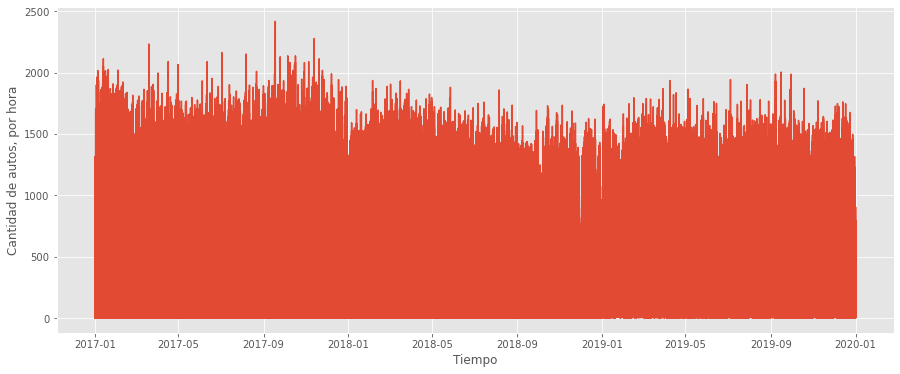

In [14]:
#Graficamos nuestros datos, tal como están
plt.figure(figsize = (15,6))
plt.plot(dataset.fecha, dataset.cantidad_pasos)
plt.xlabel('Tiempo')
plt.ylabel('Cantidad de autos, por hora')
plt.show()

In [15]:
#Resampleamos nuestros datos para agrupar por dia, y asi tal vez lograr una visualización mas amigable
diario = dataset.resample('D', on = 'fecha').sum()
print(diario.shape)
diario.head()

(1095, 1)


,cantidad_pasos
fecha,
2017-01-01,31183
2017-01-02,51568
2017-01-03,51093
2017-01-04,53332
2017-01-05,56486


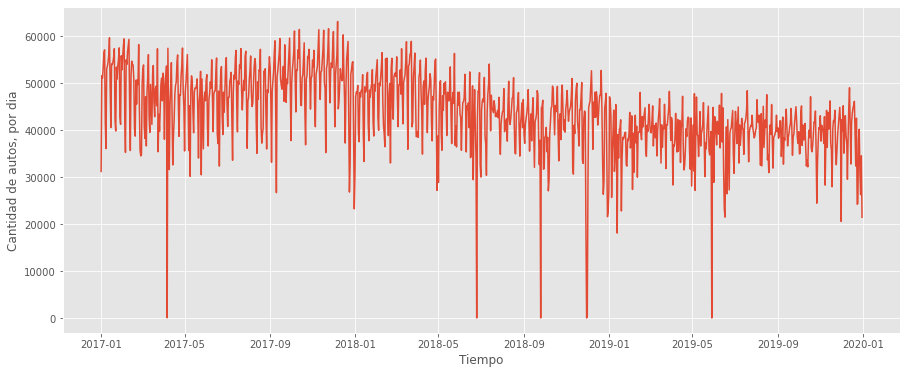

In [16]:
plt.figure(figsize = (15,6))
plt.plot(diario.index, diario.cantidad_pasos)
plt.xlabel('Tiempo')
plt.ylabel('Cantidad de autos, por dia')
plt.show()

# Análisis Exploratorio de Datos (EDA)

Relizaremos un análisis exploratorio de los datos, para responder algunas preguntas propias del dataset a medida que vayan surgiendo:

In [17]:
data = pd.concat([data_2019, data_2018, data_2017])
data

,periodo,fecha,hora_inicio,hora_fin,dia,estacion,sentido,tipo_vehiculo,forma_pago,cantidad_pasos
0,2019,2019-01-01,0,1,Martes,Alberti,Centro,Liviano,NO COBRADO,22
1,2019,2019-01-01,0,1,Martes,Alberti,Centro,Liviano,TELEPASE,6
2,2019,2019-01-01,0,1,Martes,Alberti,Provincia,Liviano,NO COBRADO,53
3,2019,2019-01-01,0,1,Martes,Alberti,Provincia,Liviano,TELEPASE,18
4,2019,2019-01-01,0,1,Martes,Avellaneda,Centro,Liviano,EFECTIVO,16
...,...,...,...,...,...,...,...,...,...,...
1372640,2017,2017-12-31,22,23,Domingo,Sarmiento,Provincia,Liviano,NO COBRADO,3
1372641,2017,2017-12-31,22,23,Domingo,Sarmiento,Provincia,Liviano,TELEPASE,10
1372642,2017,2017-12-31,22,23,Domingo,Sarmiento,Provincia,Pesado,TELEPASE,1
1372643,2017,2017-12-31,23,0,Domingo,Sarmiento,Provincia,Liviano,NO COBRADO,1


Miremos el número de datos que tenemos por estación de pago:

In [18]:
data_estacion = pd.DataFrame(data["estacion"].value_counts())
data_estacion

,estacion
Avellaneda,972656
Illia,752552
Dellepiane Centro,356885
Dellepiane Liniers,353680
Retiro,307528
Alberdi,303620
Dellepiane,187600
Alberti,132279
Sarmiento,76634
Salguero,76308


Ahora analicemos ésto de manera gráfica:

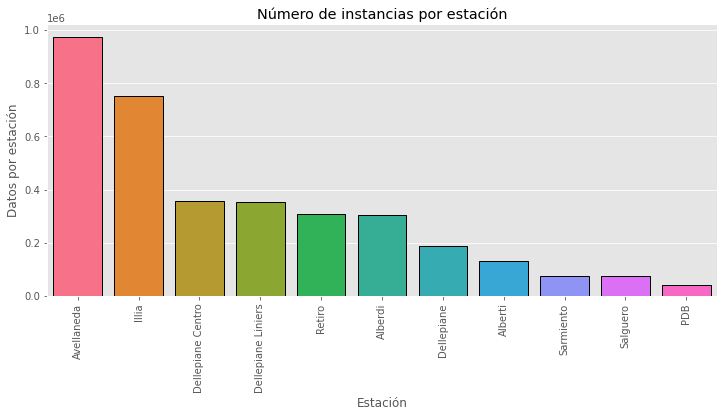

In [19]:
plt.figure(figsize=(12,5))
ax = sns.countplot(data = data, x = 'estacion',
                   order = data_estacion.index,saturation=1,linewidth=1,edgecolor=(0,0,0),palette="husl");
ax.set_title("Número de instancias por estación")
ax.set_ylabel("Datos por estación")
ax.set_xticklabels(ax.get_xticklabels(),rotation=90)
ax.set_xlabel("Estación");

Vemos que las estaciones que mayor flujo vehicular tienen son *Avellaneda* e *Illia*, respectivamente, superando a las demás por más del doble.

Ahora veamos qué días hay mayor y menor flujo vehicular para cada estación:

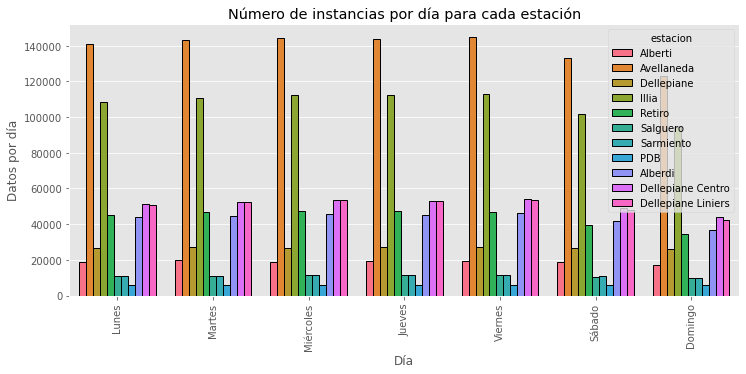

In [20]:
plt.figure(figsize=(12,5))
ax = sns.countplot(data = data, x = 'dia',
                   order = ['Lunes', 'Martes', 'Miércoles', 'Jueves', 'Viernes', 'Sábado', 'Domingo'], 
                   hue='estacion', saturation=1,linewidth=1,edgecolor=(0,0,0),palette="husl");
ax.set_title("Número de instancias por día para cada estación")
ax.set_ylabel("Datos por día")
ax.set_xticklabels(ax.get_xticklabels(),rotation=90)
ax.set_xlabel("Día");

De aquí podemos concluir que de forma general que los días con menor flujo vehicular son los fines de semana (sábado y domingo), siendo el domingo el día menos transitado de todos.

Ahora miremos algo relacionado a los tipos de pago:

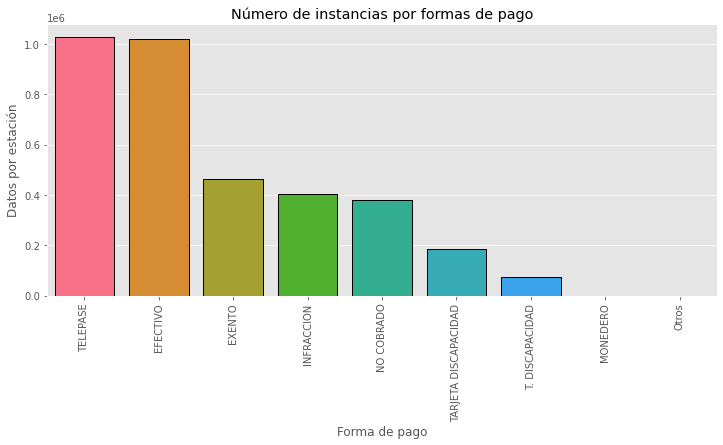

In [21]:
data_pago = pd.DataFrame(data["forma_pago"].value_counts())
plt.figure(figsize=(12,5))
ax = sns.countplot(data = data, x = 'forma_pago',
                   order = data_pago.index,saturation=1,linewidth=1,edgecolor=(0,0,0),palette="husl");
ax.set_title("Número de instancias por formas de pago")
ax.set_ylabel("Datos por estación")
ax.set_xticklabels(ax.get_xticklabels(),rotation=90)
ax.set_xlabel("Forma de pago");

Veamos el conteo de tipo de vehículo que pasa por cada estación:

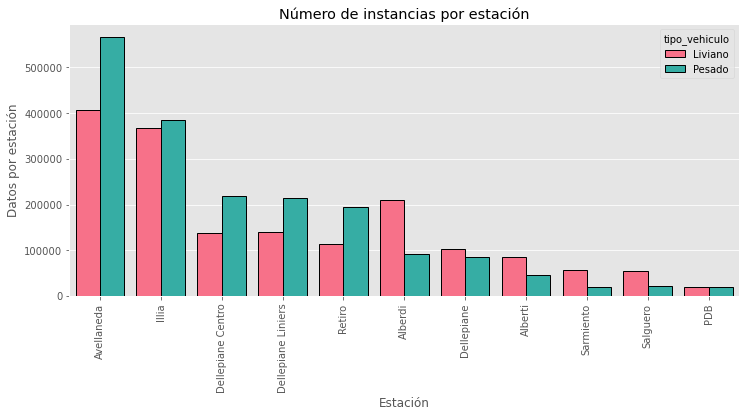

In [22]:
plt.figure(figsize=(12,5))
ax = sns.countplot(data = data, x = 'estacion',
                   order = data_estacion.index, hue='tipo_vehiculo', saturation=1,linewidth=1,edgecolor=(0,0,0),palette="husl");
ax.set_title("Número de instancias por estación")
ax.set_ylabel("Datos por estación")
ax.set_xticklabels(ax.get_xticklabels(),rotation=90)
ax.set_xlabel("Estación");

Miremos cómo es el comportamiento de la cantidad de vehículos por hora del día:

In [23]:
data_hora = data.groupby(by = 'hora_fin').mean()
data_hora.head()

,periodo,hora_inicio,cantidad_pasos
hora_fin,,,
0,2017.856828,23.0,56.772164
1,2017.858347,0.0,48.466219
2,2017.859500,1.0,37.942289
3,2017.862121,2.0,28.343268
4,2017.859203,3.0,22.639192


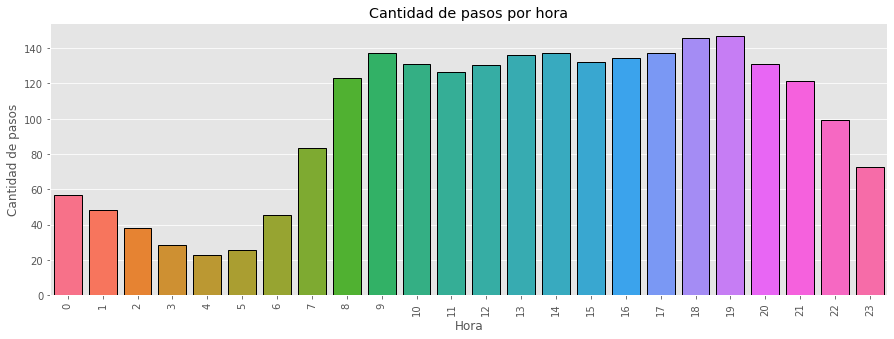

In [24]:
plt.figure(figsize=(15,5))
ax = sns.barplot(data = data_hora, x = data_hora.index, y = 'cantidad_pasos', saturation=1,linewidth=1,
                 edgecolor=(0,0,0),palette="husl");
ax.set_title("Cantidad de pasos por hora")
ax.set_ylabel("Cantidad de pasos")
ax.set_xticklabels(ax.get_xticklabels(),rotation=90)
ax.set_xlabel("Hora");

Podemos observar que hay un valor pico en horas de la mañana a las 9h, y un par de valores picos en el horario 18h-19h. El menor flujo vehicular se da a las 4h.

Ahora miremos de manera general el día con mayor flujo según el sentido de tránsito:

In [25]:
data_dia = data.groupby(by = ['dia', 'sentido']).sum().sort_values('cantidad_pasos', ascending=False)
data_dia.reset_index(drop = False, inplace = True)

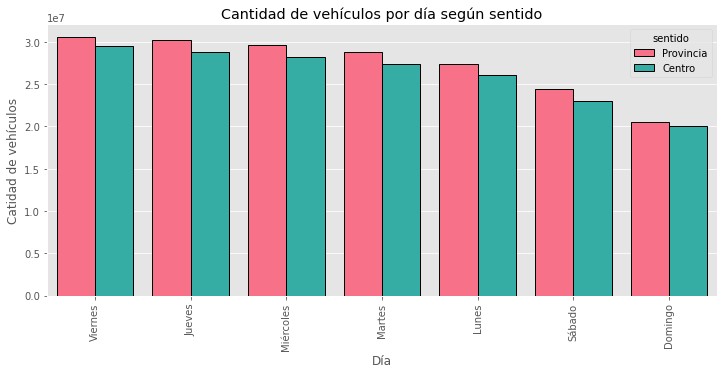

In [26]:
plt.figure(figsize=(12,5))
ax = sns.barplot(data = data_dia, x = 'dia', y = 'cantidad_pasos',
                 hue='sentido', saturation=1,linewidth=1,edgecolor=(0,0,0),palette="husl");
ax.set_title("Cantidad de vehículos por día según sentido")
ax.set_ylabel("Catidad de vehículos")
ax.set_xticklabels(ax.get_xticklabels(),rotation=90)
ax.set_xlabel("Día");

La gráfica nos indica que el día con mayor flujo, tanto en sentido Centro como Provincia es el viernes. Como es de esperar, los días con menor flujo son los fines de semana.

### Sentido con más pases por hora

In [27]:
data_hora_sentido = data.groupby(by = ['hora_fin','sentido']).mean()
data_hora_sentido.reset_index(drop = False, inplace = True)

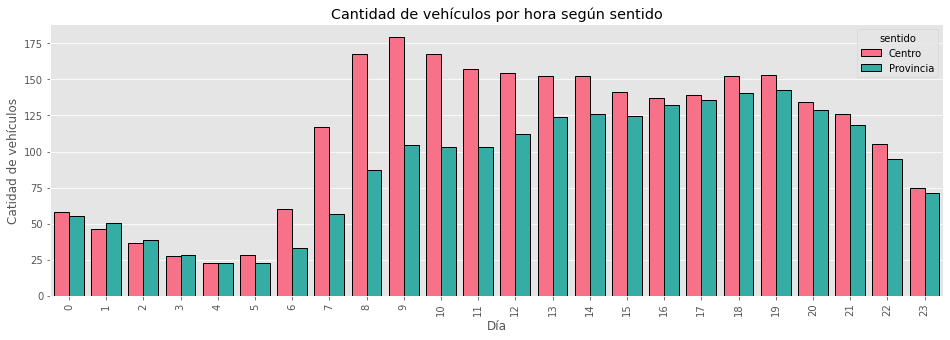

In [28]:
plt.figure(figsize=(16,5))
ax = sns.barplot(data = data_hora_sentido, x = 'hora_fin', y = 'cantidad_pasos',
                 hue='sentido', saturation=1,linewidth=1,edgecolor=(0,0,0),palette="husl");
ax.set_title("Cantidad de vehículos por hora según sentido")
ax.set_ylabel("Catidad de vehículos")
ax.set_xticklabels(ax.get_xticklabels(),rotation=90)
ax.set_xlabel("Día");

Se oberva un alto flujo a las 9h en dirección centro, lo que indica que es posible que las personas que viven por fuera van a sus respectivos trabajos. A medida que el día pasa, más personas que estaban en el Centro, salen de él.

# Series de tiempo

In [29]:
def df_process(estation, pago, freq):
    '''
    Función que entrega como salida un dataset con la cantidad de pasos por una
    estación y tipo de pago específicos, ordenado por fechas, con una frecuencia
    de muestras dada.
    '''
    d = data[(data.estacion == estation) & (data.forma_pago == pago)]
    d.fecha =  pd.to_datetime(d.fecha,dayfirst = True) + pd.to_timedelta(d.hora_fin, unit = 'h')
    d.sort_values('fecha', inplace = True)
    d.reset_index(drop=True, inplace = True)
    df =d[['fecha','cantidad_pasos']]
    df = df.resample(freq, on = 'fecha').sum()
    return df 

In [30]:
def grafica_estacion_freq(estacion, freq, val = 0):  
    
    u = df_process(estacion,'EFECTIVO', freq)
    v = df_process(estacion,'TELEPASE', freq)
    w = df_process(estacion,'INFRACCION', freq)
    z = df_process(estacion,'EXENTO', freq)
    q = df_process(estacion,'NO COBRADO',freq)    
    
    if estacion =='Illia' and freq=='d' and val == 1:
        
        plt.figure(dpi=120,figsize=(50,20));
        plt.subplots_adjust(hspace = 0.01)

        ax1 = plt.subplot(211);
        ax1 = sns.lineplot( x=u.index, y=u.cantidad_pasos, color = c1, label = 'EFECTIVO',lw = 3.5 );
        ax1.set_title(estacion,fontsize=70);
        ax1.legend(fontsize=30,shadow=True);
        ax1.grid(True);
        plt.setp(ax1.get_yticklabels(), visible=True,fontsize = 40);
        plt.setp(ax1.get_xticklabels(), visible=False,fontsize = 0);

        ax2 = plt.subplot(212);
        ax2 = sns.lineplot( x=q.index, y=q.cantidad_pasos, color = c11, label = 'NO COBRADO',lw = 3.5 );
        ax2.legend(fontsize=30,shadow=True);
        ax2.grid(True);
        plt.setp(ax2.get_xticklabels(), visible=True,fontsize = 40);
        plt.setp(ax2.get_yticklabels(), visible=True,fontsize = 40);
        
        ax1.set_ylabel('Pasos por dia ',fontsize=50);
        ax1.set_xlabel('',fontsize=0);
        ax2.set_ylabel('Pasos por dia ',fontsize=50);
        ax2.set_xlabel('',fontsize=0);
        ax2.set_ylabel('Pasos por dia ',fontsize=50);
        ax2.set_xlabel('Tiempo',fontsize=50);
        
        
    else:
        plt.figure(dpi=120,figsize=(50,20))
        plt.subplots_adjust(hspace = 0.01)

        ax1 = plt.subplot(311);
        ax1 = sns.lineplot( x=v.index, y=v.cantidad_pasos, color =c1, label = 'TELEPASE',lw = 3.5 );
        ax1 = sns.lineplot( x=u.index, y=u.cantidad_pasos, color =c3, label = 'EFECTIVO',lw = 3.5 );
        ax1.set_title(estacion,fontsize=70);
        ax1.legend(fontsize=30,shadow=True);
        ax1.grid(True);
        plt.setp(ax1.get_yticklabels(), visible=True,fontsize = 40);
        plt.setp(ax1.get_xticklabels(), visible=False,fontsize = 0);

        ax2 = plt.subplot(312);
        ax2 = sns.lineplot( x=w.index, y=w.cantidad_pasos, color =c2, label = 'INFRACCION',lw = 3.5);
        ax2 = sns.lineplot( x=z.index, y=z.cantidad_pasos, color =c4, label = 'EXENTO',lw = 3.5);
        ax2.set_ylim(0,z.cantidad_pasos.max());
        ax2.legend(fontsize=30, shadow=True);
        ax2.grid(True);

        plt.setp(ax2.get_xticklabels(), visible=False,fontsize = 0);
        plt.setp(ax2.get_yticklabels(), visible=True,fontsize = 40);

        ax3 = plt.subplot(313);
        ax3 = sns.lineplot( x=q.index, y=q.cantidad_pasos, color =c11, label = 'NO COBRADO',lw = 3.5 );
        ax3.legend(fontsize=30,shadow=True);
        ax3.grid(True);
        plt.setp(ax3.get_xticklabels(), visible=True,fontsize = 40);
        plt.setp(ax3.get_yticklabels(), visible=True,fontsize = 40);

        if freq == 'h':
            ax1.set_ylabel('Pasos por hora ',fontsize=0);
            ax1.set_xlabel('',fontsize=0);  
            ax1.set_xlim('2018-09-01 00:00:00','2018-10-01 23:00:00');
            ax2.set_ylabel('Pasos por hora ',fontsize=50);
            ax2.set_xlabel('',fontsize=0);
            ax2.set_xlim('2018-09-01 00:00:00','2018-10-01 23:00:00');
            ax3.set_ylabel('Pasos por hora ',fontsize=0);
            ax3.set_xlabel('Tiempo',fontsize=50);
            ax3.set_xlim('2018-09-01 00:00:00','2018-10-01 23:00:00');
        elif freq =='d':
            ax1.set_ylabel('Pasos por dia ',fontsize=0);
            ax1.set_xlabel('',fontsize=0);
            ax2.set_ylabel('Pasos por dia ',fontsize=50);
            ax2.set_xlabel('',fontsize=0);
            ax3.set_ylabel('Pasos por dia ',fontsize=0);
            ax3.set_xlabel('Tiempo',fontsize=50);
        elif freq =='b':
            ax1.set_ylabel('Pasos por dia lab',fontsize=0);
            ax1.set_xlabel('',fontsize=0);
            ax2.set_ylabel('Pasos por dia lab',fontsize=50);
            ax2.set_xlabel('',fontsize=0);
            ax3.set_ylabel('Pasos por dia lab',fontsize=0);
            ax3.set_xlabel('Tiempo',fontsize=50);
        elif freq=='m':
            ax1.set_ylabel('Pasos por mes ',fontsize=0);
            ax1.set_xlabel('',fontsize=0);
            ax2.set_ylabel('Pasos por mes ',fontsize=50);
            ax2.set_xlabel('',fontsize=0);
            ax3.set_ylabel('Pasos por mes ',fontsize=0);
            ax3.set_xlabel('Tiempo',fontsize=50);


## Detección de oultiers (valores atípicos)

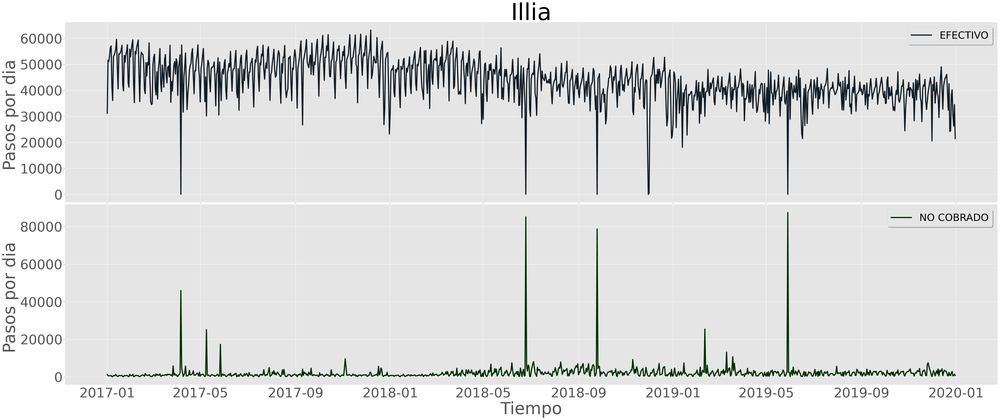

In [31]:
grafica_estacion_freq('Illia', 'd', 1)

Ésta imagen se realiza con el objetivo de detectar valores atípicos en la serie temporal, y representa la cantidad de pasos de vehículos en la estación *Illia* con pagos realizados en efectivo. La segunda gráfica representa la serie de tiempo de los pasos de autos en la misma estación pero que no fueron cobrados. Dichas gráficas se muestran juntas con el ánimo de detectar valores atípicos en las series de tiempo.

En primera aproximación se observa que la serie  de pasos por las  estación `Illia` y pagados en `efectivo` oscila en un rango de 30000 y 60000 pasos por día en el periodo de 2017 y 2018. Entre los periodos de Enero del 2018 y Enero del 2019 la serie oscila entre 30000 y 55000 pasos por día y en el periodo del 2019 al 2020 la serie es mas estable teniedo solo variaciones en un rango de 30000 y 50000 pasos por día. En adición tenemos algunos mínimos muy pronunciados que revelan ser valores atípicos cuando se compara la serie de tiempo de pagos en efectivo con la serie de tiempo de no pagos.

El paso siguiente a realizar es revisar si dichos valores mínimos se presentan en las otras formas de pago en la misma estación y en las estaciones con más instancias que encontramos en la sección anterior.

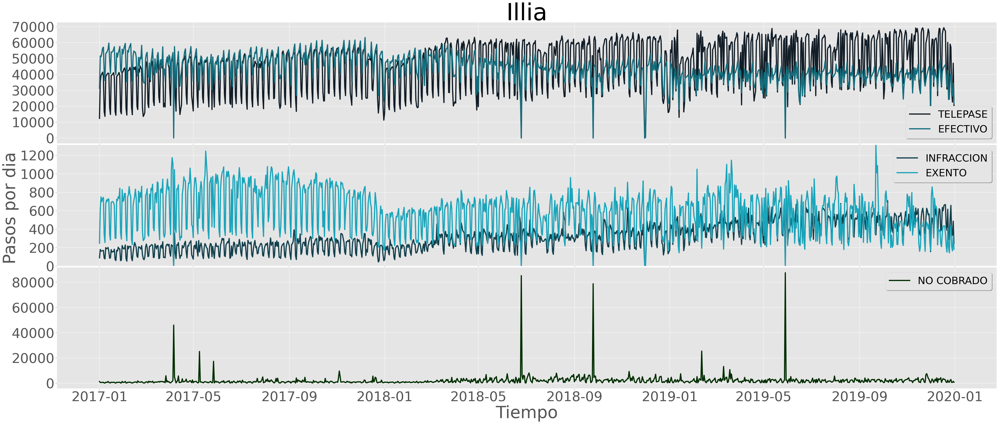

In [32]:
grafica_estacion_freq('Illia', 'd')

Efectivamente, se observa que las series de tiempo en la estación de `Illia`  de los pases al día pagados por `Telepase, Efectivo, Infracción y Exento`, presentan consistencia en los valores atípicos.

También se observa que los valores mínimos de todas las series mencionadas (excepto no cobro) se dan en las fechas: **``2017-04-06``**, **``2018-06-25``**, **``2018-09 25``**, **``2018-11-30``** , **``2018-12-01``** y **``2019-05-29``**. Dichos mínimos coinciden con los valores máximos de la serie de tiempo de pasos al día `no cobrados` en la misma estación.

Miremos más de cerca las mismas series de tiempo (Pasos por hora) en las fechas de *``01-09-2019`` al ``01-10-2019``*. 

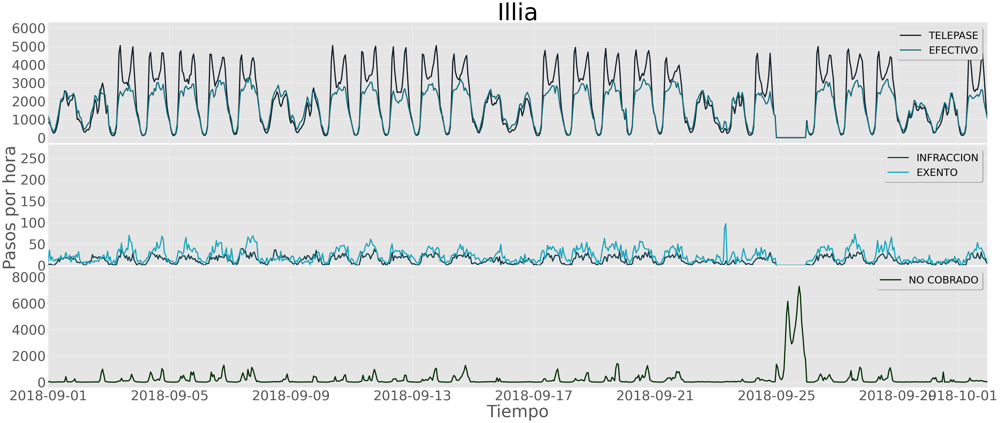

In [33]:
grafica_estacion_freq('Illia', 'h')

Los días más transitados son días laborales o en semana, cada día posee dos picos pronunciados, pertenecientes al horario de 8h-9h y 16h-18h.

Analicemos si este comportamiento es general a las otras estaciones.

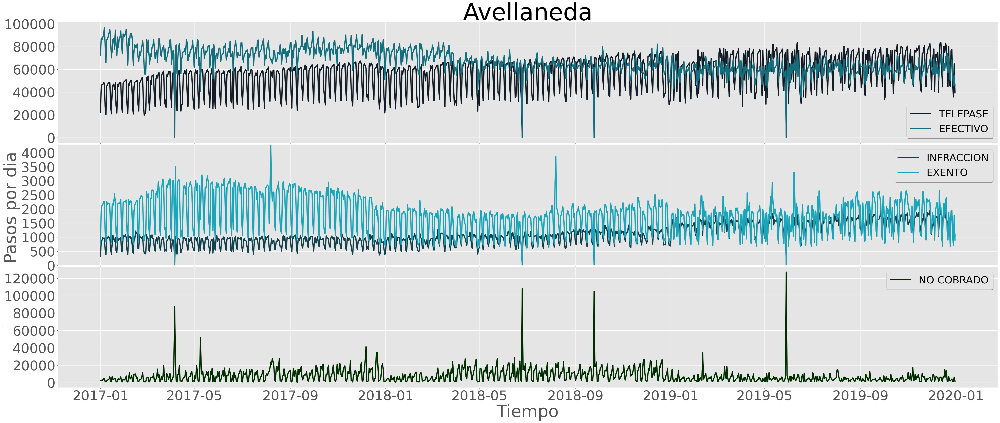

In [34]:
grafica_estacion_freq('Avellaneda', 'd')

En este caso el número de pasos registrados en `Avellaneda` por efectivo oscila en el rango de los 60000 y 90000 en el 2017, para los siguientes años, los registros disminuyen, teniendo una oscilación entre los 60000 y 80000 pasos por día. 

Para los registros pagados por infracción se tiene un rango de oscilación entre 500 y 1000 pasos al día, y los pagados por exento poseen mayor rango de oscilación, entre 500 y 3000 pasos por día. Hay algo para destacar en esta serie partícular, y es que posee dos valores máximos, uno en el mes de agosto de 2017 y el otro en el mes mismo mes pero el siguiente año.

Por último, se encuentra el mismo comportamiento registrado en los pasos de la serie de Illia: donde los días con máximo número de pasos no cobrados coinciden con los mínimos de las demás series.

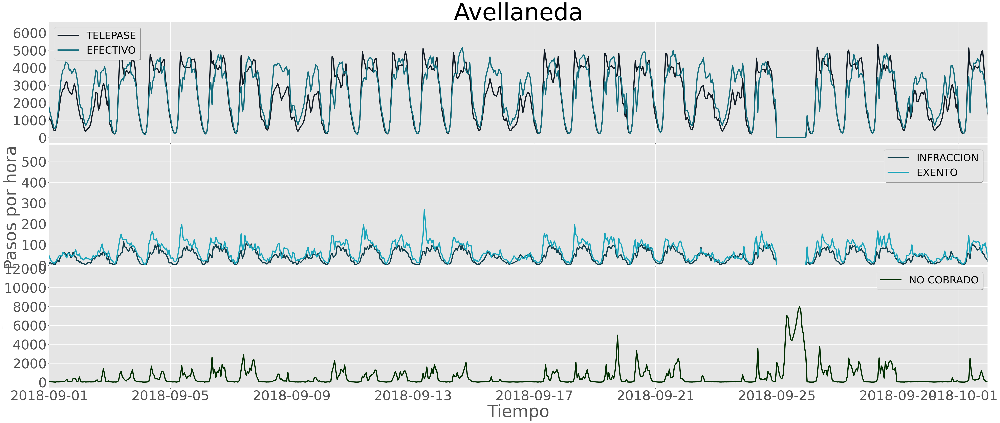

In [35]:
grafica_estacion_freq('Avellaneda', 'h')

Afirmativamente tenemos un comportamiento general en todas las estaciones: los días donde se presenta un máximo en los dias de no cobro existe un mínimo en los diferentes tipos de cobro. Por últimos, busquemos evidencias en las demás estaciones graficando unicamente su comportamiento a con fecuencia horaria en un mes partícular: `01-09-2019 al 01-10-2019.`

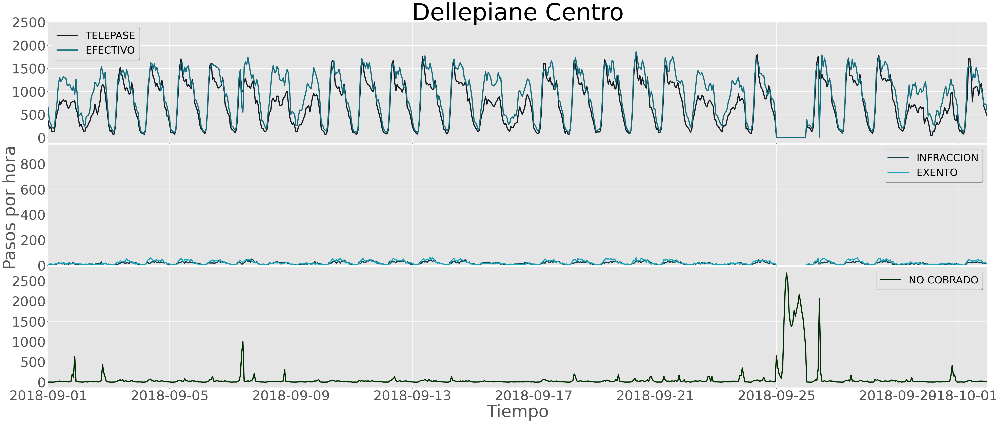

In [36]:
grafica_estacion_freq('Dellepiane Centro', 'h')

Evidencia generalizada, ver parráfo anterior.

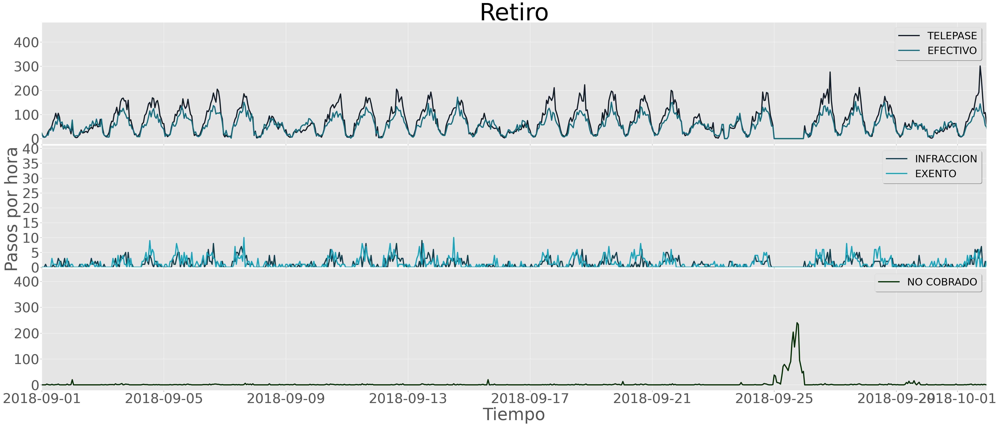

In [37]:
grafica_estacion_freq('Retiro', 'h')

Con este comportamiento general, es evidente que debemos preguntarnos cuales fueron los motivos para un no pago en todas las estaciones de servicio de flujo vehicular. Aquí se lista algo de evidencia: Sucesos ocurridos en las mismas fechas de los valores atípicos en el pais.

### Posibles motivos por los que se paralizó el flujo vehicular en las estaciones

**2018-06-25**: [*Los sindicatos peronistas paralizan por tercera vez Argentina*](https://elpais.com/internacional/2018/06/25/argentina/1529921664_282510.html)

**2018-09-25**: [*Desde las 0 están afectados el transporte público de pasajeros; el transporte de mercaderías; la atención en dependencias públicas; la apertura de comercios; la actividad financiera y el dictado de clases en las escuelas.*](https://www.infobae.com/politica/2018/09/25/la-cgt-encabeza-el-cuarto-paro-general-contra-el-gobierno-de-mauricio-macri/)

Teniendo claro cuales son los valores atípicos en cada serie, nos propnemos a analizar como caso partícular la serie de tiempos con frecuencia diaria de la estación Illia que fue pagada en efectivo.

In [38]:
u = df_process('Illia','EFECTIVO', 'd')

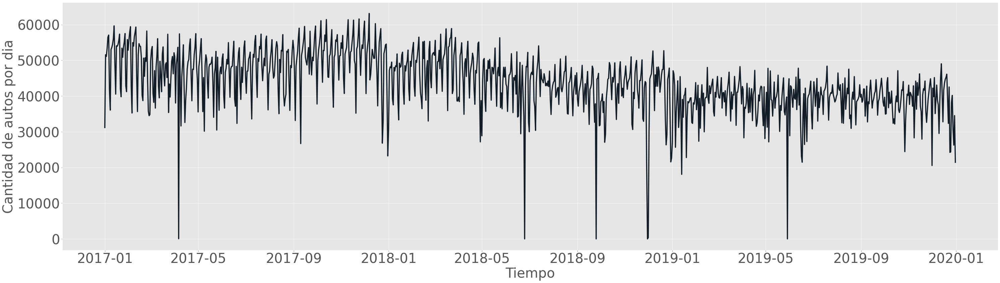

In [39]:
plt.figure(figsize=(50,30));
ax1 = plt.subplot(211);
ax1 = sns.lineplot( x=u.index, y=u.cantidad_pasos, color = c1,lw = 3.5 );
#ax1.legend(fontsize=30,shadow=True);
ax1.grid(True);
plt.setp(ax1.get_yticklabels(), visible=True,fontsize = 40);
plt.setp(ax1.get_xticklabels(), visible=True,fontsize = 40);
plt.xlabel('Tiempo',fontsize = 40)
plt.ylabel('Cantidad de autos por dia',fontsize = 40);

In [40]:
#Se define el filtro Hampel
def hampel_filter_forloop(input_series, window_size, n_sigmas=4):
    
    n = len(input_series)
    new_series = input_series.copy()
    k = 1.4826 # scale factor for Gaussian distribution
    
    indices = []
    
    # possibly use np.nanmedian 
    for i in range((window_size),(n - window_size)):
        x0 = np.median(input_series[(i - window_size):(i + window_size)])
        S0 = k * np.median(np.abs(input_series[(i - window_size):(i + window_size)] - x0))
        if (np.abs(input_series[i] - x0) > n_sigmas * S0):
            new_series[i] = x0
            indices.append(i)
    
    return new_series, indices

In [41]:
res, detected_outliers = hampel_filter_forloop(u.cantidad_pasos, 10)
u['cantidad_pasos_filtro'] = res

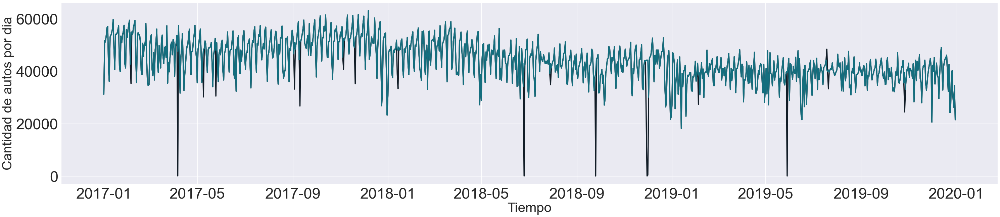

In [42]:
plt.figure(figsize=(50,10));
sns.set(font_scale=4.1)
sns.lineplot( x=u.index, y=u.cantidad_pasos, color = c1,lw = 3.5 );
sns.lineplot( x=u.index, y=u.cantidad_pasos_filtro, color = c3,lw = 3.5 );
plt.grid(True);
plt.xlabel('Tiempo',fontsize = 40)
plt.ylabel('Cantidad de autos por dia',fontsize = 40);

# Estacionariedad
### RUEBA DICKEY - FULLER DE ESTACIONARIEDAD
Una serie es estacionaria cuando es estable a lo largo del tiempo, es decir, cuando la `media` y la `varianza` son constantes en el tiempo y ademas no presentan tendencia.

Para llevar a cabo un análisis adecuado de series de tiempo es vital determinar si los datos siguen un proceso estacionario o no estacionario y esto lo logramos a partir de una  prueba de contraste de hipótesis. Vamos a tener como hipótesis nula que la serie es *No Estacionaria*. Con lo cual la alternativa es que sí lo es.

Cuando hacemos el contraste de hipótesis, siempre tenemos que calcular el valor de un estadístico de prueba, que dependerá de los valores de la
muestra y de nuestra hipótesis nula.
Otra manera de llegar a estas conclusiones es a través del p-valor. El p-valor se puede interpretar como el valor que representa cuán probable es la hipótesis nula. Si es un valor muy cercano a cero significa que esa hipótesis es poco probable y habría que rechazarla.
¿Cómo sabemos si es un valor muy bajo, pero suficiente para rechazar la Hipótesis nula? Porque siempre que hagamos algo en inferencia vamos a tener un nivel de confianza, por ejemplo, el 95%, y lo que le falta a eso para llegar al 100% es
nuestro nivel de significación, es decir 0.05. Entonces compararíamos el p-valor con el nivel de significación. Si es más pequeño diremos que es
suficientemente bajo para rechazar la Hipótesis nula.

En Python lo haremos con el método ``sts.adfuller`` del paquete stattools.

In [43]:
import statsmodels.tsa.stattools as sts
sts.adfuller(u.cantidad_pasos_filtro)

(-1.606827631679374,
 0.48016291675010964,
 20,
 1074,
 {'1%': -3.4364533503600962,
  '5%': -2.864234857527328,
  '10%': -2.568204837482531},
 21192.927689841064)

El p-valor en este caso es aproximadamente `0.48` lo cual es mucho mayor que el nivel de significancia ``0.05``, por tanto no se rechaza la hipótesis nula. Lo que indica que la serie es No estacionaria.

# Estacionalidad
Este concepto no se explica bien en el curso, por lo que se tratará de dar una breve introducción de los conceptos con los que se trabajarán.

La estacionalidad sugiere que ciertas tendencias aparecerán de forma cíclica. Por ejemplo, las temperaturas suben y bajan según las horas del día y los meses del año. Estos son dos ejemplos distintos de patrones estacionales que observamos en nuestra vida, el cambio durante el día y el cambio durante un año completo.
Hay varias formas de comprobar si existe estacionalidad.
Un enfoque es descomponer la secuencia de la serie temporal en tres efectos.
1. Tendencia
2. Estacional
3. Residual
Por supuesto, la tendencia representa el patrón consistente en todos los datos. El efecto estacional expresa todos los efectos cíclicos debido a la estacionalidad. Finalmente, los residuos son el error de predicción, o la diferencia entre los datos reales y el modelo que ajustamos. El tipo más simple de descomposición es la descomposición clásica. Con ella esperamos una relación lineal entre las tres partes y la serie de tiempo observada. Hay dos enfoques principales en la descomposición clásica:
- Aditivo
- Multiplicativo

El aditivo supone que, para cualquier período de tiempo, el valor observado es la suma de la tendencia, más el efecto estacional, más el residual, para ese período. Del mismo modo, la descomposición multiplicativa supone que la serie original es un producto de los tres efectos.

El Python, el paquete de modelos de estadística incluye un método llamado ``seasonal_decompose`` que significa descomposición estacional, que coge una serie de tiempo y la divide en esos tres efectos.

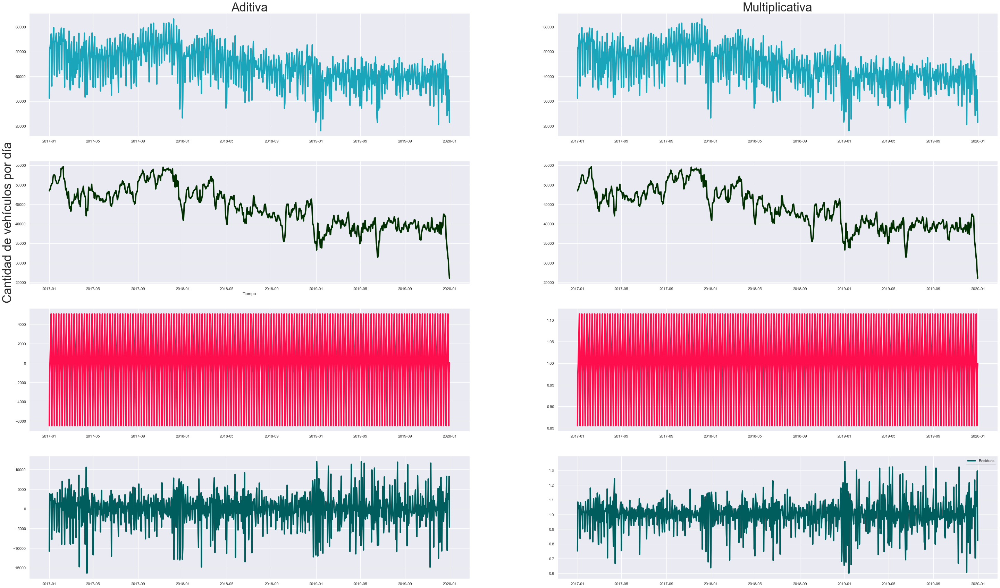

In [44]:
s_dec_add = seasonal_decompose( u.cantidad_pasos_filtro, model = 'additive',extrapolate_trend='freq')
s_dec_mul = seasonal_decompose( u.cantidad_pasos_filtro, model = 'multiplicative',extrapolate_trend='freq')

plt.figure(figsize=(50,30));
sns.set(font_scale=1)

plt.subplot(4,2,1)
plt.title('Aditiva',fontsize = 35)
plt.plot(s_dec_add.observed,lw = 4, color = c4, label = 'Serie original')


plt.subplot(4,2,3)
plt.plot(s_dec_add.trend,lw = 4, color = c6, label ='Tendencia')
plt.xlabel('Tiempo')
plt.ylabel('Cantidad de vehículos por día',fontsize = 35 )

plt.subplot(4,2,5)
plt.plot(s_dec_add.seasonal,lw = 4, color = c8, label='Estacionalidad')

plt.subplot(4,2,7)
plt.plot(s_dec_add.resid,lw = 4, color = c7, label = 'Residuos')


plt.subplot(4,2,2)
plt.title('Multiplicativa',fontsize = 35)
plt.plot(s_dec_mul.observed,lw = 4, color = c4, label = 'Serie original')


plt.subplot(4,2,4)
plt.plot(s_dec_mul.trend,lw = 4, color = c6, label = 'Tendencia')

plt.subplot(4,2,6)
plt.plot(s_dec_mul.seasonal,lw = 4, color = c8, label = 'Estacionalidad')

plt.subplot(4,2,8)
plt.plot(s_dec_mul.resid,lw = 4, color = c7,label = 'Residuos')
plt.legend()

plt.show()

La descomposición aditiva es la más adecuada cuando no se tienen cambios significativos en la magnitud de las fluctuaciones del componente estacional. Si ese no fuese el caso, entonces la descomposición multiplicativa sería la indicada. En este proyecto, dado que no hay cambios significativos en usar alguno de los métodos, entonces por descarte usaremos la descomposición aditiva. No hay estacionalidad en los datos.

## Componentes de la Serie
### Técnica de la media móvil
Consiste en tomar una ventana de tiempo suficientemente grande y promediar la serie sobre esa ventana siendo posible de esta manera obtener la tendencia. Una característica de este método es que no asume ninguna forma para la serie de tiempo.

In [45]:
promedio_tendencia = u.cantidad_pasos_filtro.rolling(window= 30, center = True).mean()

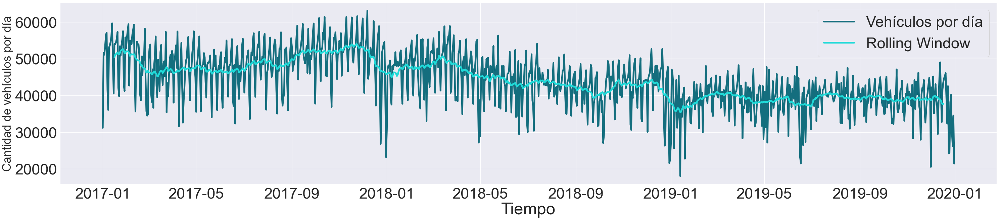

In [46]:
plt.figure(figsize=(50,10));
sns.set(font_scale=4.1)
sns.lineplot(x=u.index, y=u.cantidad_pasos_filtro, lw = 5,label = 'Vehículos por día',color = c3)
plt.plot(promedio_tendencia, lw = 5, label = 'Rolling Window',color = c5)
plt.xlabel('Tiempo')
plt.ylabel('Cantidad de vehículos por día',fontsize = 35)
plt.legend()
plt.show()

### Técnica de la tendencia lineal
Este método consiste simplemente en ajustar una regresión lineal a la serie.

In [47]:
from sklearn.linear_model import LinearRegression

#convertimos la fecha a tipo númerico, para luego hacer regresión lineal
u['fecha_numeros'] =u.index.map(dt.datetime.toordinal)

lr = LinearRegression()
lr.fit(u.fecha_numeros.values.reshape(-1, 1), u.cantidad_pasos_filtro)

LinearRegression()

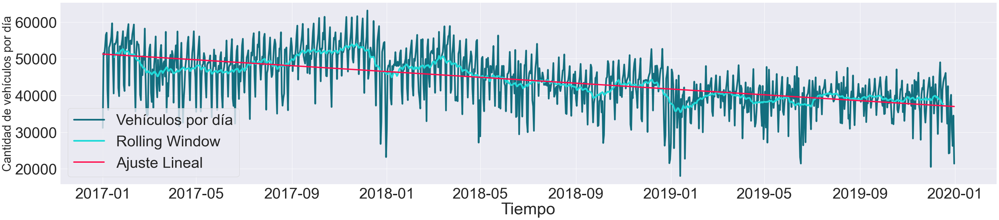

In [48]:
plt.figure(figsize=(50,10));
sns.set(font_scale=4.1)
sns.lineplot(x=u.index, y=u.cantidad_pasos_filtro, lw = 5,label = 'Vehículos por día',color = c3)
plt.plot(promedio_tendencia, lw = 5, label = 'Rolling Window',color = c5)
plt.plot(u.index, lr.predict(u.fecha_numeros.values.reshape(-1, 1)), lw = 4, label = 'Ajuste Lineal', color = c8)
plt.xlabel('Tiempo')
plt.ylabel('Cantidad de vehículos por día',fontsize = 35)
plt.legend()
plt.show()

Lo que se puede apreciar claramente en este gráfico es una marcada tendencia negativa en la cantidad de vehículos que circulan por este peaje pagando en efectivo con el pasar de los años.

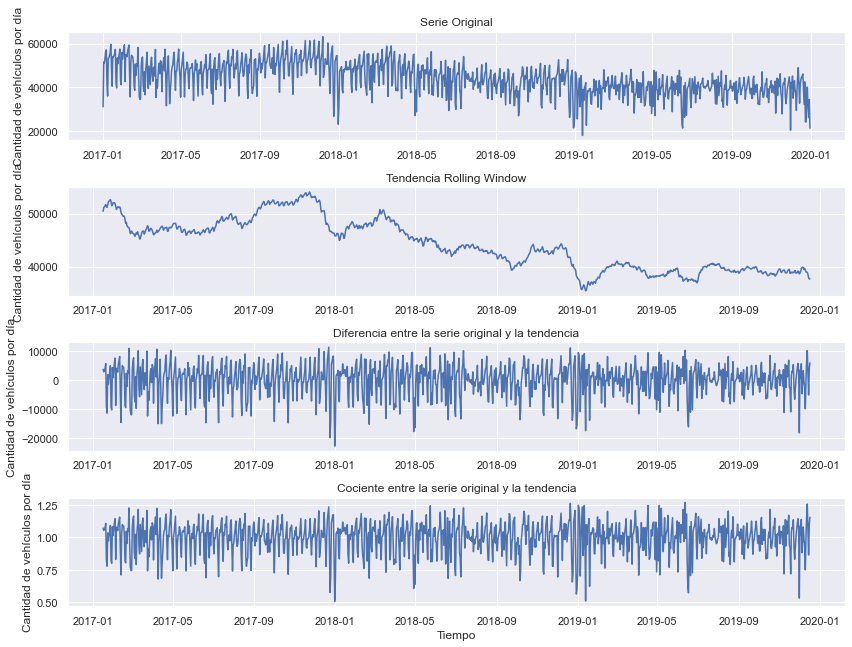

In [49]:
plt.figure(figsize = (12,9))
sns.set(font_scale=1)
plt.subplot(4,1,1)
plt.title('Serie Original')
plt.plot(u.index, u.cantidad_pasos_filtro)
plt.ylabel('Cantidad de vehículos por día')

plt.subplot(4,1,2)
plt.title('Tendencia Rolling Window')
plt.plot(promedio_tendencia)
plt.ylabel('Cantidad de vehículos por día')

plt.subplot(4,1,3)
plt.title('Diferencia entre la serie original y la tendencia')
plt.plot(u.index, u.cantidad_pasos_filtro - promedio_tendencia)
plt.ylabel('Cantidad de vehículos por día')

plt.subplot(4,1,4)
plt.title('Cociente entre la serie original y la tendencia')
plt.plot(u.index, u.cantidad_pasos_filtro / promedio_tendencia)
plt.xlabel('Tiempo')
plt.ylabel('Cantidad de vehículos por día')

plt.tight_layout()
plt.show()

Aquí se tiene la descomposición de la serie en las 3 componentes mencionadas. Si hacemos una adición de ellas, nos daría la serie original.

## Autocorrelación
La autocorrelación representa la correlación entre una secuencia y sí misma. Más precisamente, mide el nivel de semejanza
entre una secuencia de hace varios períodos y los datos reales. 

En series temporales es vital poder calcular y comparar los valores de autocorrelación entre diferentes retrasos. Para ello, necesitamos introducir la función de autocorrelación o ``ACF `` (autocorrelation function). n Python usaremos la función ``plot_acf``.

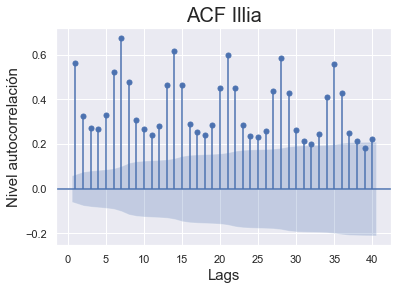

In [50]:
sns.set(font_scale=1);
sgt.plot_acf(u['cantidad_pasos_filtro'], lags = 40, zero = False);
plt.title("ACF Illia", size = 20);
plt.xlabel('Lags',fontsize = 15)
plt.ylabel('Nivel autocorrelación',fontsize = 15);

El eje vertical nos presenta el nivel de autocorrelación entre dos periodos diferentes de la serie. El eje horizontal representa los lags o retrasos con los cuales estamos trabajando. Observe que no hay línea azul vertical en el retraso cero, pues esta tendría un valor de autocorrelación de 1. En adición se observa un patrón de autocorrelación positiva que se repite cada siete retrazos, es decir cada 7 días. Por otro lado, auque esta correlación es positiva, su valor máximo es menor a 0.7 y a medida que se aumenta los retrasos disminuye la autocorrelación, esto es debído a que cuanto mayor distancia en el tiempo es más improbable que dos eventos de la serie de tiempo estén correlacionados.

Por último, el área sombreada en azul representa la significación de los valores de autocorrelación, es decir, mide si son significativamente distintos de cero, lo que sugiere la existencia de autocorrelación para ese retraso especifico, esta área se expande a medida que se aumenta los retrasos, algo que valida el último argumento del parráfo anterior. En adición cuando ésta región se traslapa con las líneas verticales quiere decir que no hay argumentos para garantizar la autocorrelación entre los eventos, es decir, según el gráfico que solo se pueden hacer prediciones máximo con un mes de retraso.

En conclusión, nuestros datos son altamente dependientes de la fecha en que se midan, pues la autocorrelación varía significativamente dependiento del retraso.

### Autocorrelación parcial
Una autocorrelación parcial es un resumen de la relación entre una observación en una serie temporal con observaciones en etapas anteriores, sin tener en cuenta las relaciones de las observaciones intermedias.

La autocorrelación parcial en el lag `k` es la correlación que resulta después de eliminar el efecto de cualquier correlación debida a los términos en lags intermedios. La autocorrelación para una observación y una observación en un paso de tiempo anterior se compone tanto de la correlación directa como de las correlaciones indirectas. Estas correlaciones indirectas son una función lineal de la correlación de la observación, con observaciones en pasos de tiempo intermedios.

Son estas correlaciones indirectas las que la función de autocorrelación parcial busca eliminar. Ver más [aquí]( https://machinelearningmastery.com/gentle-introduction-autocorrelation-partial-autocorrelation/).
La función PACF se utilizará para investigar cuántos retrasos son necesarios en
el modelo autorregresivo. En Python usaremos la función ``plot_pacf``.

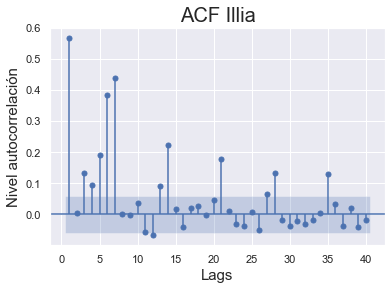

In [51]:
sgt.plot_pacf(u['cantidad_pasos_filtro'], lags = 40, zero = False, method = ('ols'))
plt.title("ACF Illia", size = 20);
plt.xlabel('Lags',fontsize = 15)
plt.ylabel('Nivel autocorrelación',fontsize = 15);
plt.show()

Observe que el primer valor es igual al de la gráfica anterior, esto se debe a que hay un unico canal (un unico día de retraso) que afecta la correlación. Por otro lado, no nos enfocaremos en los puntos que estan dentro de la región azul, pues no son significativos, y nos enfocaremos más bien en la información de los valores más altos, que igualmente se repiten cada 7 refrasos, pero disminuyen a medida que el tiempo es más grande.

# Predecir el Futuro

Debes implementar un modelo que prediga el tráfico en la autopista Illia para el último trimestre del 2019.

- Haz todas las transformaciones de datos que consideres necesarias. Justifica.
- Evalúa de forma apropiada tus resultados. Justifica la métrica elegida.
- Elige un modelo benchmark y compara tus resultados con este modelo.
- Optimiza los hiperparámetros de tu modelo.
- Intenta responder la pregunta: ¿Qué información está usando el modelo para predecir?
- Utiliza el modelo creado para predecir el tráfico en el año 2020. ¿Cómo funciona?
- Si lo deseas, puedes agregar información de años anteriores a 2017. ¿Mejoran los resultados? Exploraré esta opción luego, no será tenido en cuenta para el alcance de este proyecto.

En nuestro anterior analísis concluimos que las variables categóricas no tenían una gran influencia o por el momento no identificamos potencial necesario en ellas para que sean tenidas en cuenta al momento de elaborar una predicción futura en la cantidad de vehículos que pagarán en efectivo en la estación Illia. De esta manera, utilizando solo la información pasada como variable nos enfocaremos a realizar una predicción univariada de nuestra serie de tiempo.

## Transformaciones de datos
En este caso, usaremos los datos ya transformados y guardados en el dataframe `u`, del cual usaremos los datos transformados por el filtro. Ver sección anterior con todas las justificaciones realizadas.

In [52]:
serie =u.cantidad_pasos_filtro 
serie

fecha
2017-01-01    31183
2017-01-02    51568
2017-01-03    51093
2017-01-04    53332
2017-01-05    56486
              ...  
2019-12-27    40182
2019-12-28    30681
2019-12-29    26259
2019-12-30    34523
2019-12-31    21447
Freq: D, Name: cantidad_pasos_filtro, Length: 1095, dtype: int64

# Machine Learning: Construcción de Modelos predictivos

## Modelo Benchmark
Como modelo base para comparar o benchmark simplmente predecíremos los valores de y copiando el valor de la fecha anterior. Vale aclarar que aquí estamos haciendo one-step prediction, es decir, que estamos prediciendo un valor a la vez y no un conjunto o secuencia de valores que sería multi-step prediction.

In [53]:
# En primer lugar, debemos definir cuántos valores hacia atrás tomaremos.
look_back = 365 # Dias atras para predecir el dia siguiente
N=serie.shape[0]
N

1095

In [54]:
# Definimos X e Y
X = np.zeros((N - look_back - 1,look_back)) # Lo que estamos haciendo es crear una fila en X con 365 valores para cada fila en Y que vamos a predecir
y = np.zeros(N - look_back - 1)
print(X.shape, y.shape)

(729, 365) (729,)


In [55]:
for i in range(X.shape[0]): #X.shape[0] es la cantidad de valores a pronosticar que es igual a y.shape[0]
    X[i,:] = serie.iloc[i:i+look_back]
    y[i] = serie.iloc[i+look_back]

In [56]:
N_train = 913 - look_back # cantidad de instancias que vamos a usar para entrenar (365*2.5=913). 
N_test = 182 #cantidad de puntos que vamos a usar para evaluar (365*0.5=182).
N_total = N_train + N_test
length_total = N_train + N_test + look_back

In [57]:
X_train = X[:N_train,:]
y_train = y[:N_train]
print(X_train.shape, y_train.shape)

X_test = X[N_train:N_train+N_test,:]
y_test = y[N_train:N_train+N_test]
print(X_test.shape, y_test.shape)

(548, 365) (548,)
(181, 365) (181,)


In [58]:
# Hacemos el train/test split.
X_train = X[:N_train,:]
y_train = y[:N_train]
print(X_train.shape, y_train.shape)

X_test = X[N_train:N_train+N_test,:]
y_test = y[N_train:N_train+N_test]
print(X_test.shape, y_test.shape)

(548, 365) (548,)
(181, 365) (181,)


In [59]:
y_test_pred = y[-1 + N_train:N_train+N_test - 2]
print(y_test_pred.shape)

(181,)


In [60]:
def graf_serie(y_test, y_test_pred, modelo):
    
    if modelo =='Benchmark':
        rmse_test = np.sqrt(mean_squared_error(y_test, y_test_pred))
        r2 = r2_score( y_test_pred,y_test)
    
        print('---------------------------------------------------------------------------------------------------------------------')
        print(f'                             Raíz del error cuadrático medio en Test: {rmse_test:0.3f}')
        print(f'                             Coeficiente de Determinación por r2_score: {r2:0.3f}')
        print('---------------------------------------------------------------------------------------------------------------------')
        
        plt.figure(figsize=(50,15));
        sns.set(font_scale=4.1)
        sns.lineplot(x = serie.index[:length_total],y= serie[:length_total],lw = 5, label = 'Serie Original', color = c1)
        plt.plot(serie.index[N_train+look_back: length_total-1], y_test_pred,'-.', lw = 4, label = 'Predicho en Test',color = 'purple')
        plt.legend()
        plt.xlabel('Tiempo')
        plt.ylabel('Cantidad de vehículos por día')
        plt.title (modelo, fontweight = 'black')
        plt.show()
    else:
        rmse_train = np.sqrt(mean_squared_error(y_train, y_train_pred))
        rmse_test = np.sqrt(mean_squared_error(y_test, y_test_pred))
        r2 = r2_score( y_test_pred,y_test)
    
        print('---------------------------------------------------------------------------------------------------------------------')
        print(f'                             Raíz del error cuadrático medio en Test: {rmse_test:0.3f}')
        print(f'                             Raíz del error cuadrático medio en Train: {rmse_train:0.3f}')
        print(f'                             Coeficiente de Determinación por r2_score: {r2:0.3f}')
        print('---------------------------------------------------------------------------------------------------------------------')
        
        plt.figure(figsize=(50,15));
        sns.set(font_scale=4.1)
        sns.lineplot(x = serie.index[:length_total],y= serie[:length_total],lw = 5, label = 'Serie Original', color = c1)
        sns.lineplot(x = serie.index[:N_train + look_back], y = serie[:N_train + look_back],lw = 5 ,label = 'Usado para entrenar', color = c4)
        plt.plot(serie.index[look_back: look_back + N_train],  y_train_pred,'-.',lw = 4, label = 'Predicho en Train',color = c9)
        plt.plot(serie.index[N_train+look_back: length_total-1], y_test_pred,'-.', lw = 4, label = 'Predicho en Test',color = 'purple')
        plt.legend()
        plt.xlabel('Tiempo')
        plt.ylabel('Cantidad de vehículos por día')
        plt.title (modelo, fontweight = 'black')
        plt.show()

---------------------------------------------------------------------------------------------------------------------
                             Raíz del error cuadrático medio en Test: 5766.207
                             Coeficiente de Determinación por r2_score: -0.651
---------------------------------------------------------------------------------------------------------------------


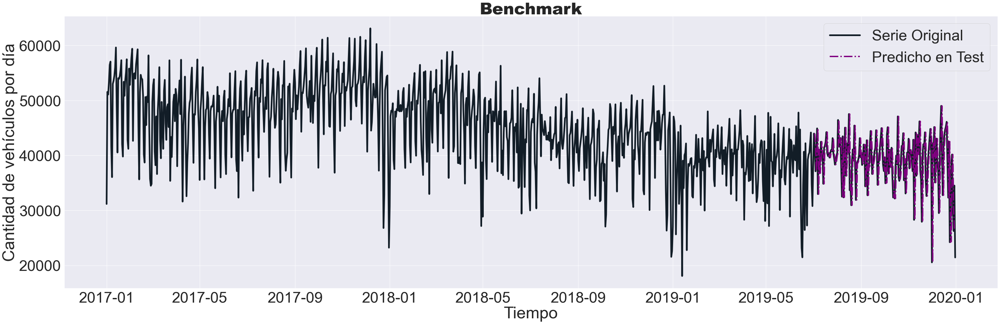

In [61]:
graf_serie(y_test, y_test_pred, 'Benchmark')

El $R^2$ negativo aparece cuando la suma de cuadrados residual se acerca a la suma total de cuadrados, lo que significa que la explicación de la respuesta es muy, muy baja o insignificante, es decir el ``modelo Benchmark`` es muy pobre en predición. Los resultados pueden mejorarse con el aumento del tamaño de la muestra o cambiando por mejores modelos.

In [62]:
def grafica_diagnostico(y_train,y_train_pred,y_test,y_test_pred,name):
    ''' y_test_pred: arreglo de numpy de shape (n,) con la informacion de la variable predicha por el modelo
     residuo: error entre y_test_pred-y_test
     rmse_train,rmse_test,r2: m\'etricas de calificacion del modelo
     modelo: nombre del modelo usado en formato r'\textbf{nombre: }'
    Retorna: 
     m\'etricas de calificacion del modelo y 4 graficas del modelo: valor real vs, predicho, errores,
     distribucion errores y grafico q-q plot'''
    # ==============================================================================

    sns.set(font_scale=1.)
    fig, axes = plt.subplots(nrows=2, ncols=2, figsize=(15, 8))
    #linea y=x
    xx = np.linspace(y_test.min()-0.1*y_test.mean(), y_test.max()+0.1*y_test.mean(),10000)
    yy = xx
    
    axes[0, 0].scatter(y_test_pred,y_test, c='c', alpha = 0.8)
    axes[0, 0].plot(xx,yy,'k--', color = 'black', lw=2)
    axes[0, 0].set_title('Valor real vs valor predicho', fontsize = 20, fontweight = "bold")
    axes[0, 0].set_xlabel('Real',fontsize = 20)
    axes[0, 0].set_ylabel('Predicción',fontsize = 20)
    axes[0, 0].tick_params(labelsize = 17)

    axes[0, 1].scatter(list(range(len(y_train_pred))), y_train - y_train_pred,c='purple', alpha = 0.8)
    axes[0, 1].axhline(y = 0, linestyle = '--', color = 'black', lw=2)
    axes[0, 1].set_title('Residuos del modelo', fontsize = 20, fontweight = "bold")
    axes[0, 1].set_xlabel('Dato',fontsize = 20)
    axes[0, 1].set_ylabel('Residuo',fontsize = 20)
    axes[0, 1].tick_params(labelsize = 17)

    sns.distplot(y_train - y_train_pred, bins = 20, label = 'train',color='purple',ax = axes[1, 0])

    axes[1, 0].set_title('Distribución residuos del modelo', fontsize = 20, fontweight = "bold")
    axes[1, 0].set_xlabel("Residuo",fontsize = 20)
    axes[1, 0].set_ylabel("Cuentas",fontsize = 20)
    
    #axes[1, 0].tick_params(labelsize = 17)

    import statsmodels.api as sm
    sm.qqplot(
        y_train - y_train_pred,
        fit   = True,
        line  = 'q',
        ax    = axes[1, 1], 
        color = 'firebrick',
        alpha = 0.8,
        lw    = 2
    )
    axes[1, 1].set_title('Q-Q residuos del modelo', fontsize = 20, fontweight = "bold")
    axes[1, 1].tick_params(labelsize = 17)
    axes[1, 1].set_ylabel("Datos ordenados",fontsize = 20)
    axes[1, 1].set_xlabel("Cuantiles Normal Estándar",fontsize = 20)

    fig.tight_layout()
    plt.subplots_adjust(top=0.9)
    fig.suptitle(name+ '\n\n', fontsize = 25, fontweight = "bold");
    
    rmse_train = np.sqrt(mean_squared_error(y_train, y_train_pred))
    rmse_test = np.sqrt(mean_squared_error(y_test, y_test_pred))
    r2 = r2_score( y_test_pred,y_test)
    
    print('---------------------------------------------------------------------------------------------------------------------')
    print(f'                             Raíz del error cuadrático medio en Test: {rmse_test:0.3f}')
    print(f'                             Raíz del error cuadrático medio en Train: {rmse_train:0.3f}')
    print(f'                             Coeficiente de Determinación por r2_score: {r2:0.3f}')
    print('---------------------------------------------------------------------------------------------------------------------')
    

# Modelo Random Forest

In [63]:
from sklearn.ensemble import RandomForestRegressor

rf = RandomForestRegressor(n_estimators=100, random_state=42, n_jobs = 4).fit(X_train,y_train)
y_pred = rf.predict(X)
y_train_pred = rf.predict(X_train)
y_test_pred = rf.predict(X_test)

In [64]:
serie.index[N_train+look_back: length_total].shape

(182,)

---------------------------------------------------------------------------------------------------------------------
                             Raíz del error cuadrático medio en Test: 4595.811
                             Raíz del error cuadrático medio en Train: 1759.314
                             Coeficiente de Determinación por r2_score: -4.281
---------------------------------------------------------------------------------------------------------------------


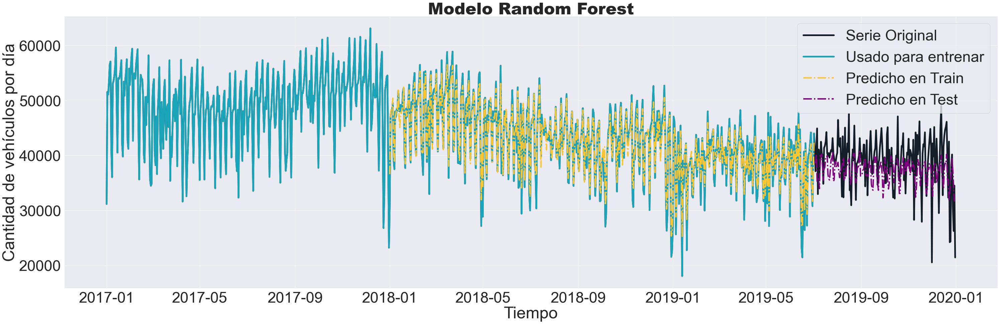

In [65]:
graf_serie(y_test, y_test_pred, 'Modelo Random Forest')

El $𝑅^2$ negativo aparece cuando la suma de cuadrados residual se acerca a la suma total de cuadrados, lo que significa que la explicación de la respuesta es muy, muy baja o insignificante, es decir el modelo de Random Forest es muy pobre en predición. Los resultados pueden mejorarse con el aumento del tamaño de la muestra o optimizando el modelo.

---------------------------------------------------------------------------------------------------------------------
                             Raíz del error cuadrático medio en Test: 4595.811
                             Raíz del error cuadrático medio en Train: 1759.314
                             Coeficiente de Determinación por r2_score: -4.281
---------------------------------------------------------------------------------------------------------------------


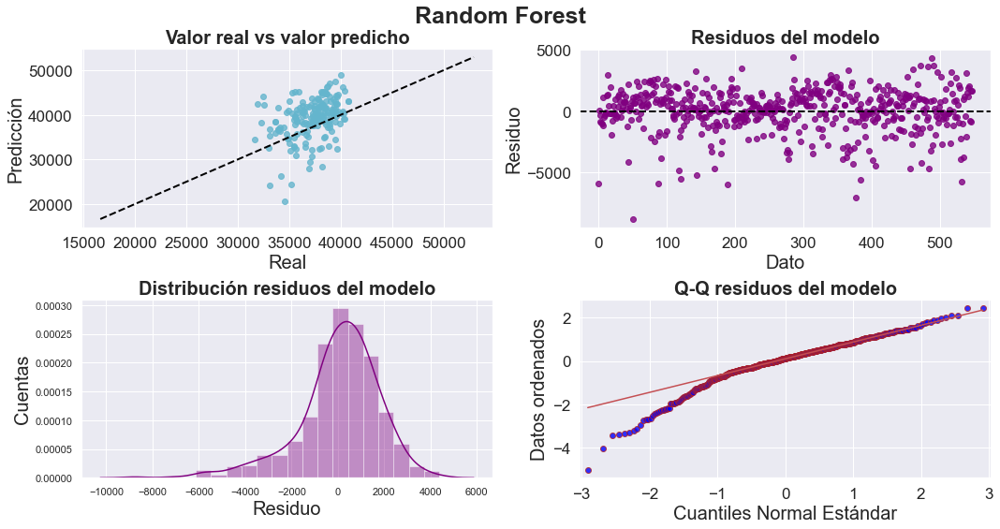

In [66]:
grafica_diagnostico(y_train,y_train_pred,y_test,y_test_pred,'Random Forest')

Con respecto al modelo base, vemos una mejoria en el comportamiento de los errores ambas cantidades fueron reducidas.

### ¿Qué información está usando el modelo para predecir?

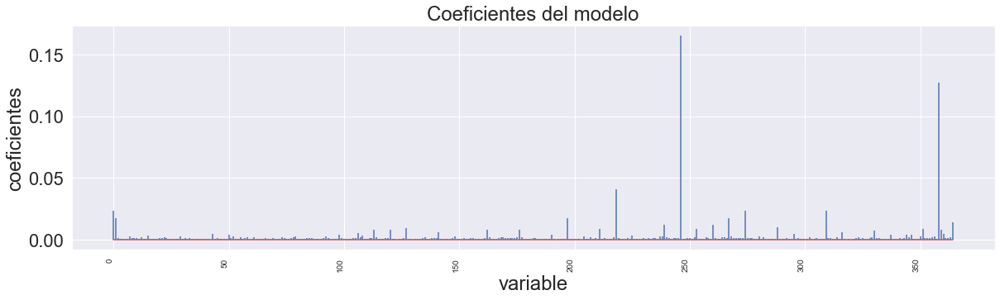

In [67]:
# Coeficientes del modelo
# ==============================================================================
sns.set(font_scale=2.)
df_coeficientes = pd.DataFrame(
                        {'predictor': np.arange(rf.feature_importances_.size),
                         'coef': rf.feature_importances_.flatten()}
                  )
fig, ax = plt.subplots(figsize=(20, 5))
ax.stem(df_coeficientes.predictor, df_coeficientes.coef, markerfmt=' ')
plt.xticks(rotation=90, ha='right', size=10)
ax.set_xlabel('variable')
ax.set_ylabel('coeficientes')
ax.set_title('Coeficientes del modelo');

Vemos que los días que más contribuyen al pronóstico del futuro son el día 220, 240 y 260. 

## Optimización hiperparámetro 

Procederemos a optimizar los hiperparámetros del modelo de RandomForest. En este caso al tratarse de una serie de tiempo, hay que tener cuidado al hacer CrossValidation, ya que los subconjuntos en que dividamos nuestro conjunto de Train no pueden estar compuestos por datos seleccionados aleatoriamente, sino que deben ser un conjunto de datos con fechas contiguas. Para esto usaremos TimeSeriesSplit de Sklearn.

In [68]:
from sklearn.model_selection import  GridSearchCV, TimeSeriesSplit
tss= TimeSeriesSplit(n_splits= 10)

param_grid = {'n_estimators':[ 20, 50,100,200],
              'max_depth': [i for i in range(2,20)],
              'max_features': ['auto', 'sqrt', 'log2'], 
              'min_samples_split': [2, 5, 10],
              'min_samples_leaf': [1, 2, 4, 6]} 
rf_reg=RandomForestRegressor(random_state=42)
rf_gs =GridSearchCV(rf_reg, param_grid, scoring='neg_root_mean_squared_error', cv=tss,verbose=5,n_jobs=-1)

In [69]:
rf_gs.fit(X_train,y_train)

Fitting 10 folds for each of 2592 candidates, totalling 25920 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done   2 tasks      | elapsed:    3.0s
[Parallel(n_jobs=-1)]: Done  56 tasks      | elapsed:   10.5s
[Parallel(n_jobs=-1)]: Done 146 tasks      | elapsed:   26.5s
[Parallel(n_jobs=-1)]: Done 272 tasks      | elapsed:   48.6s
[Parallel(n_jobs=-1)]: Done 434 tasks      | elapsed:  1.3min
[Parallel(n_jobs=-1)]: Done 632 tasks      | elapsed:  1.5min
[Parallel(n_jobs=-1)]: Done 866 tasks      | elapsed:  1.6min
[Parallel(n_jobs=-1)]: Done 1136 tasks      | elapsed:  1.8min
[Parallel(n_jobs=-1)]: Done 1442 tasks      | elapsed:  2.0min
[Parallel(n_jobs=-1)]: Done 1784 tasks      | elapsed:  3.3min
[Parallel(n_jobs=-1)]: Done 2162 tasks      | elapsed:  4.0min
[Parallel(n_jobs=-1)]: Done 2576 tasks      | elapsed:  4.3min
[Parallel(n_jobs=-1)]: Done 3026 tasks      | elapsed:  5.1min
[Parallel(n_jobs=-1)]: Done 3512 tasks      | elapsed:  6.8min
[Parallel(n_jobs=-1)]: Done 4034 tasks      | ela

GridSearchCV(cv=TimeSeriesSplit(max_train_size=None, n_splits=10),
             estimator=RandomForestRegressor(random_state=42), n_jobs=-1,
             param_grid={'max_depth': [2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13,
                                       14, 15, 16, 17, 18, 19],
                         'max_features': ['auto', 'sqrt', 'log2'],
                         'min_samples_leaf': [1, 2, 4, 6],
                         'min_samples_split': [2, 5, 10],
                         'n_estimators': [20, 50, 100, 200]},
             scoring='neg_root_mean_squared_error', verbose=5)

In [70]:
pd.DataFrame(rf_gs.cv_results_).sort_values('rank_test_score').head()

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_max_depth,param_max_features,param_min_samples_leaf,param_min_samples_split,param_n_estimators,params,...,split3_test_score,split4_test_score,split5_test_score,split6_test_score,split7_test_score,split8_test_score,split9_test_score,mean_test_score,std_test_score,rank_test_score
918,0.420474,0.121176,0.011071,0.000941,8,sqrt,1,5,100,"{'max_depth': 8, 'max_features': 'sqrt', 'min_...",...,-2572.235469,-4649.997892,-4123.391668,-8129.114099,-3323.423856,-5401.916314,-5147.934125,-4907.360404,1407.267619,1
867,8.544040,4.601963,0.020545,0.001017,8,auto,1,2,200,"{'max_depth': 8, 'max_features': 'auto', 'min_...",...,-2556.525154,-4457.882384,-4340.823257,-7949.740594,-3567.564351,-5471.526911,-5153.199223,-4907.819511,1361.049020,2
871,7.623700,4.323610,0.019847,0.000698,8,auto,1,5,200,"{'max_depth': 8, 'max_features': 'auto', 'min_...",...,-2580.901290,-4491.128774,-4362.304266,-7977.686210,-3531.080700,-5444.243665,-5122.733645,-4909.140193,1361.675800,3
1303,8.263591,4.910754,0.020146,0.001532,11,auto,1,5,200,"{'max_depth': 11, 'max_features': 'auto', 'min...",...,-2579.635801,-4468.210043,-4357.347819,-7958.759918,-3520.853103,-5463.195674,-5118.070310,-4910.037500,1361.737381,4
1063,0.830478,0.288262,0.020844,0.001134,9,sqrt,1,5,200,"{'max_depth': 9, 'max_features': 'sqrt', 'min_...",...,-2742.307769,-4552.230076,-4104.667461,-8172.297933,-3330.988492,-5351.400638,-5205.957947,-4910.385410,1390.189898,5


In [71]:
abs(rf_gs.best_score_)

4907.360403573197

In [72]:
rf_gs.best_params_

{'max_depth': 8,
 'max_features': 'sqrt',
 'min_samples_leaf': 1,
 'min_samples_split': 5,
 'n_estimators': 100}

In [73]:
rf_h = RandomForestRegressor(max_depth= 6,
                             max_features= 'sqrt',
                             n_estimators= 100, 
                             random_state=42,
                             min_samples_leaf=1,
                             min_samples_split= 5,
                             n_jobs = -1)

In [74]:
rf_h.fit(X_train,y_train)

RandomForestRegressor(max_depth=6, max_features='sqrt', min_samples_split=5,
                      n_jobs=-1, random_state=42)

In [75]:
y_train_pred = rf_h.predict(X_train)
y_test_pred = rf_h.predict(X_test)

---------------------------------------------------------------------------------------------------------------------
                             Raíz del error cuadrático medio en Test: 4486.408
                             Raíz del error cuadrático medio en Train: 3027.659
                             Coeficiente de Determinación por r2_score: -11.656
---------------------------------------------------------------------------------------------------------------------


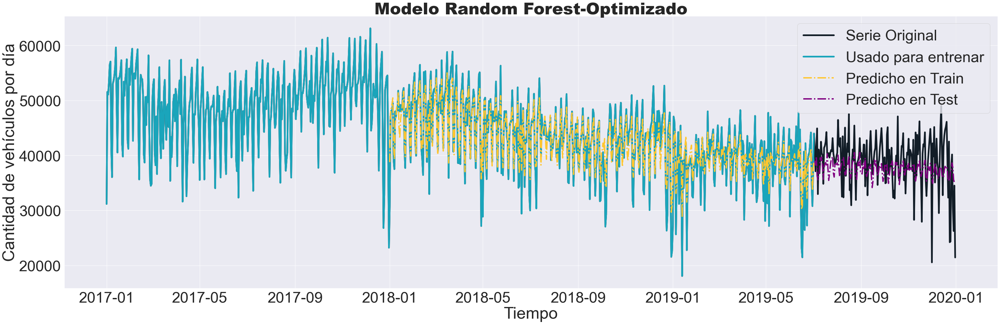

In [76]:
graf_serie(y_test, y_test_pred, 'Modelo Random Forest-Optimizado')

---------------------------------------------------------------------------------------------------------------------
                             Raíz del error cuadrático medio en Test: 4486.408
                             Raíz del error cuadrático medio en Train: 3027.659
                             Coeficiente de Determinación por r2_score: -11.656
---------------------------------------------------------------------------------------------------------------------


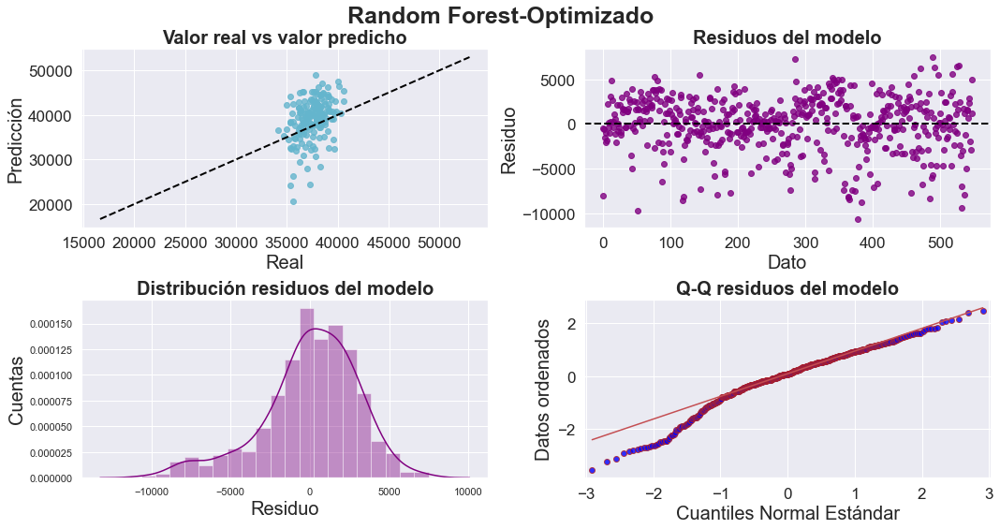

In [77]:
grafica_diagnostico(y_train,y_train_pred,y_test,y_test_pred,'Random Forest-Optimizado')

Observamos que los hiperparametros elegidos por el GS no reducen el error por lo cual se procede a realizar busqueda manual de los hiperparámetros

In [78]:
rf_h_1 = RandomForestRegressor(max_depth=15,
                             max_features= 'auto',
                             n_estimators=1000, 
                             random_state=42,
                             min_samples_leaf=2,
                             min_samples_split= 4,
                             n_jobs = -1)

In [79]:
rf_h_1.fit(X_train,y_train)

RandomForestRegressor(max_depth=15, min_samples_leaf=2, min_samples_split=4,
                      n_estimators=1000, n_jobs=-1, random_state=42)

In [80]:
y_train_pred = rf_h_1.predict(X_train)
y_test_pred = rf_h_1.predict(X_test)

---------------------------------------------------------------------------------------------------------------------
                             Raíz del error cuadrático medio en Test: 4475.285
                             Raíz del error cuadrático medio en Train: 1847.099
                             Coeficiente de Determinación por r2_score: -4.778
---------------------------------------------------------------------------------------------------------------------


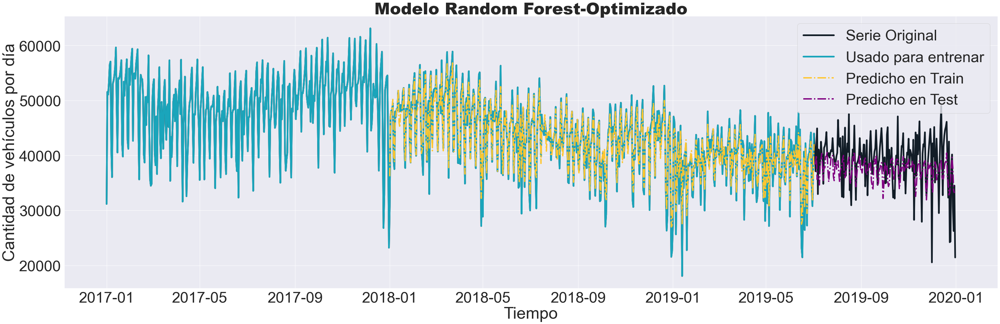

In [81]:
graf_serie(y_test, y_test_pred, 'Modelo Random Forest-Optimizado')

# Modelo Xgboost

In [82]:
import xgboost as xgb
from sklearn.model_selection import TimeSeriesSplit, GridSearchCV
import numpy as np

model = xgb.XGBRegressor()
param_search = {'nthread': [4],
              'objective': ['reg:squarederror'],
              'learning_rate': [0.1,0.2,0.3],
              'max_depth':[4,5,6,7],
              'min_child_weight': [1,2,3,4],
              'subsample':[0.5,0.7,0.8,0.9,1],
              'colsample_bytree':[0.5,0.7,1],
              'reg_lambda':[1,2,3],
              'n_estimators':[20,50,100,200]} 
# Optimización de hiperparámetros

tscv = TimeSeriesSplit(n_splits=3)
gsearch = GridSearchCV(estimator=model, cv=tscv,scoring='neg_mean_squared_error',
                        param_grid=param_search)
gsearch.fit(X_train, y_train)

GridSearchCV(cv=TimeSeriesSplit(max_train_size=None, n_splits=3),
             estimator=XGBRegressor(base_score=None, booster=None,
                                    colsample_bylevel=None,
                                    colsample_bynode=None,
                                    colsample_bytree=None, gamma=None,
                                    gpu_id=None, importance_type='gain',
                                    interaction_constraints=None,
                                    learning_rate=None, max_delta_step=None,
                                    max_depth=None, min_child_weight=None,
                                    missing=nan, mono...
                                    scale_pos_weight=None, subsample=None,
                                    tree_method=None, validate_parameters=None,
                                    verbosity=None),
             param_grid={'colsample_bytree': [0.5, 0.7, 1],
                         'learning_rate': [0.1, 0.2, 0.3],
  

In [83]:
y_train_pred = gsearch.predict(X_train)
y_test_pred = gsearch.predict(X_test)

In [84]:
y_train_pred.shape

(548,)

---------------------------------------------------------------------------------------------------------------------
                             Raíz del error cuadrático medio en Test: 5217.244
                             Raíz del error cuadrático medio en Train: 1374.980
                             Coeficiente de Determinación por r2_score: -3.201
---------------------------------------------------------------------------------------------------------------------


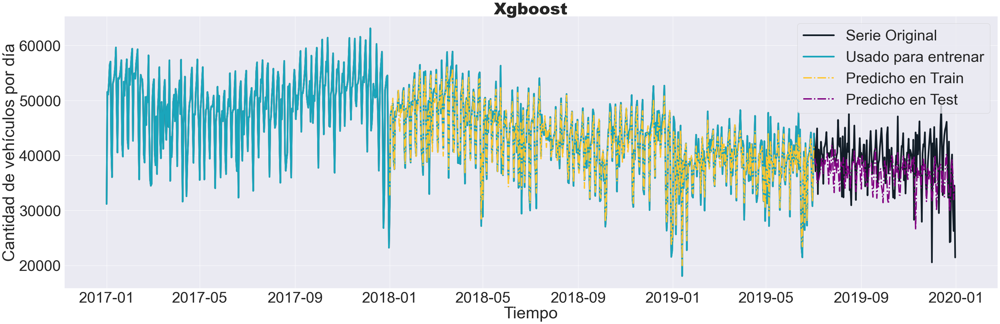

In [85]:
graf_serie(y_test, y_test_pred, 'Xgboost')

Vemos que las prediciones mejoran sustancialmente por el métodode Xgboost.

---------------------------------------------------------------------------------------------------------------------
                             Raíz del error cuadrático medio en Test: 5217.244
                             Raíz del error cuadrático medio en Train: 1374.980
                             Coeficiente de Determinación por r2_score: -3.201
---------------------------------------------------------------------------------------------------------------------


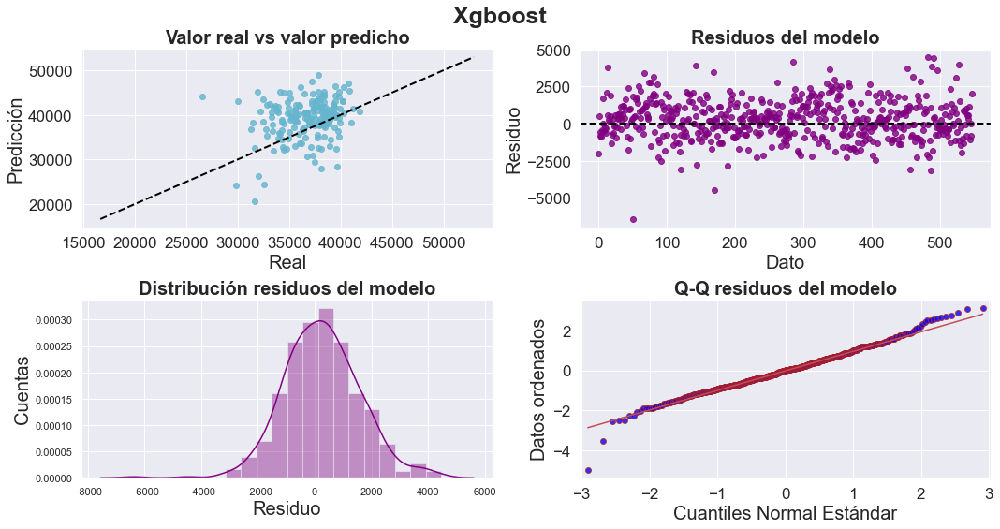

In [86]:
grafica_diagnostico(y_train,y_train_pred,y_test,y_test_pred,'Xgboost')

Los errores en ambos conjuntos son reducidos, pero aún así el coeficiente de determinación indica que el modelo se puede mejorar.

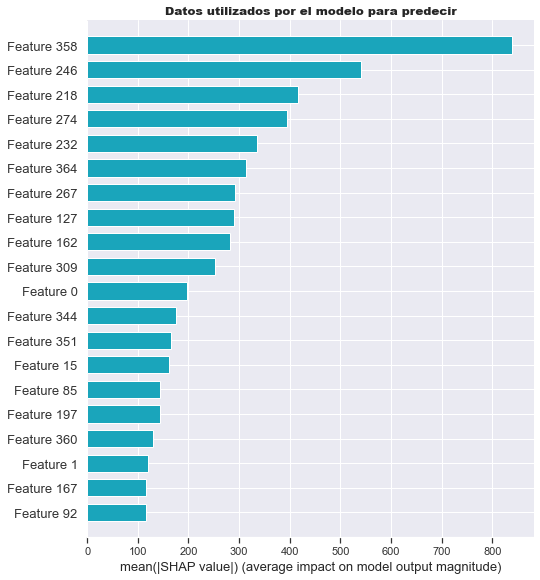

In [87]:
import shap
model = gsearch.best_estimator_
shap_values = shap.TreeExplainer(model).shap_values(X_train)
plt.title ('Datos utilizados por el modelo para predecir',fontweight = 'black')
shap.summary_plot(shap_values, X_train, plot_type="bar" ,color = c4)

El modelo utiliza los días 358, 246, 218 como los mejores estimadores para predecir, esto hace referencia a lo encontrado en el análisis de autocorrelación.

# Comparación modelos


In [88]:
error_modelos = pd.DataFrame({
                        'modelo': ['Benchmark', 'RandomForest', 'RandomForest-Optimizado',
                                   'RandomForest-Manual','Xgboost Optimizado'],
                        'rmse_test': [5766.2,4595.8, 4486.4,4475.3,5217.2],
                        'rmse_train': [3200,1759.3,3027.659,1847.1,1375]
                     })

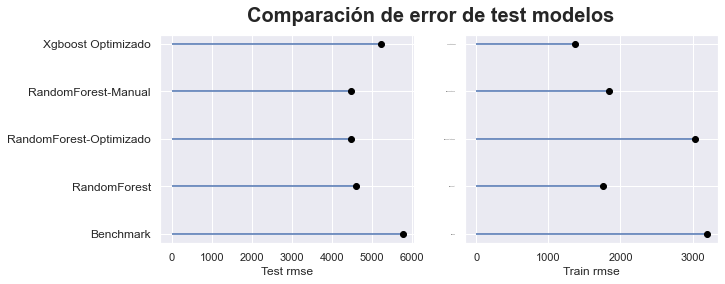

In [89]:
fig = plt.figure(figsize=(10, 3.84)) 
ax1 = plt.subplot(1,2,1) 
ax1.hlines(error_modelos.modelo, xmin=0, xmax=error_modelos.rmse_test, color ='b')
ax1.plot(error_modelos.rmse_test, error_modelos.modelo, "o", color='black')
ax1.tick_params(axis='y', which='major', labelsize=12)
ax1.set_xlabel('Test rmse');

ax2 = plt.subplot(1,2,2)
ax2.hlines(error_modelos.modelo, xmin=0, xmax=error_modelos.rmse_train,color='b')
ax2.plot(error_modelos.rmse_train, error_modelos.modelo, "o", color='black')
ax2.tick_params(axis='y', which='major', labelsize=0)
ax2.set_xlabel('Train rmse');
fig.suptitle('Comparación de error de test modelos', fontsize = 20, fontweight = "bold");

Entre los modelos entrenados, vemos que el que posee mejor performance, es decir, menor ``RMSE`` en el conjunto de train es Xgboost Optimizado, por lo cual es este modelo que se usará para predecir el futuro.

# Utiliza el modelo creado para predecir el tráfico en el año 2020. ¿Cómo funciona?
En el caso de las series de tiempo, cada vez que se quiera hacer una nueva predicción es importante re entrenar el modelo agregando los nuevos datos. En este caso, re entrenaremos el modelo considerando los 3 años de datos que tenemos.

In [91]:
data_2020 = pd.read_csv('flujo-vehicular-2020.csv', sep =',')

In [92]:
data_2020.info()
data_2020.forma_pago.value_counts()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2533743 entries, 0 to 2533742
Data columns (total 13 columns):
 #   Column          Dtype  
---  ------          -----  
 0   periodo         float64
 1   fecha           object 
 2   mes             object 
 3   dia             object 
 4   dia_fecha       float64
 5   hora_inicio     float64
 6   hora_fin        float64
 7   estacion        object 
 8   tipo_vehiculo   object 
 9   forma_pago      object 
 10  observacion     object 
 11  sentido         object 
 12  cantidad_pasos  float64
dtypes: float64(5), object(8)
memory usage: 251.3+ MB


Tag                  1429726
Violación             424291
Efectivo              264083
Rec.Deuda             187388
Exento                149718
Tarjeta Magnética      50495
CPP                    17379
Mercado Pago           10663
Name: forma_pago, dtype: int64

In [93]:
d = data_2020 [(data_2020 .estacion == 'ILLIA') & (data_2020 .forma_pago == 'Efectivo')]
d.fecha =  pd.to_datetime(d.fecha,dayfirst = True) + pd.to_timedelta(d.hora_fin, unit = 'h')
d.sort_values('fecha', inplace = True)
d.reset_index(drop=True, inplace = True)
df =d[['fecha','cantidad_pasos']]
df = df.resample('d', on = 'fecha').sum()

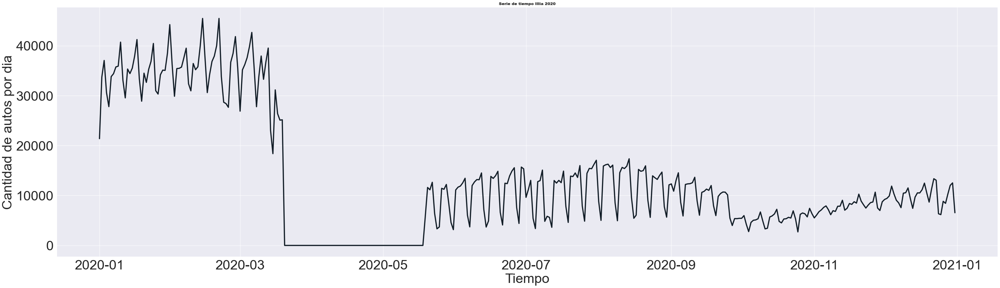

In [94]:
plt.figure(figsize=(50,30));
ax1 = plt.subplot(211);
ax1 = sns.lineplot( x=df.index, y=df.cantidad_pasos, color = c1,lw = 3.5 );
#ax1.legend(fontsize=30,shadow=True);
ax1.grid(True);
plt.setp(ax1.get_yticklabels(), visible=True,fontsize = 40);
plt.setp(ax1.get_xticklabels(), visible=True,fontsize = 40);
plt.xlabel('Tiempo',fontsize = 40)
plt.ylabel('Cantidad de autos por dia',fontsize = 40);
plt.title ('Serie de tiempo Illia 2020', fontweight = 'black');

Esta serie de tiempo en el año 2020 posee un comportamiento atípico a lo explorado en los años anteriores y es la pandemia actual que afecto todos los campos sociales. Vemos un cierre total entre el mes de marzo al mes de julio, consecuencia del confinamiento

In [95]:
# Generamos una serie con datos vacíos para todo el año 2020
start = dt.datetime(2020, 1, 1)
end = dt.datetime(2020, 12, 31)
index = pd.date_range(start, end)

s2020=pd.Series(np.zeros(366))
s2020.index=index
# Agregamos estos datos a nuestra serie original que tenía los datos de los años 2017,2018 y 2019.
serie2020=serie.append(s2020)
serie2020

2017-01-01    31183.0
2017-01-02    51568.0
2017-01-03    51093.0
2017-01-04    53332.0
2017-01-05    56486.0
               ...   
2020-12-27        0.0
2020-12-28        0.0
2020-12-29        0.0
2020-12-30        0.0
2020-12-31        0.0
Freq: D, Length: 1461, dtype: float64

In [96]:
look_back2020=365 #Vamos a usar un año de datos anteriores para predecir
N2020=serie2020.shape[0] #El total de N que tendremos será la serie que acabamos de crear.
N2020

1461

In [97]:
# Definimos X e Y
X2020 = np.zeros((N2020 - look_back2020 - 1,look_back2020)) # Lo que estamos haciendo es crear una fila en X con 365 valores para cada fila en Y que vamos a predecir
y2020 = np.zeros(N2020 - look_back2020 - 1)
print(X2020.shape, y2020.shape)

(1095, 365) (1095,)


In [98]:
# LLenamos los X e y
for i in range(X2020.shape[0]): #X.shape[0] es la cantidad de valores a pronosticar que es igual a y.shape[0], es decir, 1094.
    X2020[i,:] = serie2020.iloc[i:i+look_back2020]
    y2020[i] = serie2020.iloc[i+look_back2020]

In [99]:
N_train2020=len(serie)-look_back2020 #Para entrenar vamos a utilizar los 3 años completos de datos
N_test2020 = len(s2020)
N_total2020 = N_train2020 + N_test2020
length_total2020 = N_train2020 + N_test2020 + look_back2020
length_total2020

1461

In [100]:
# Hacemos el train/test split.
X_train2020 = X2020[:N_train2020,:]
y_train2020 = y2020[:N_train2020]
print(X_train2020.shape, y_train2020.shape)

X_test2020 = X2020[N_train2020:N_train2020+N_test2020,:]
y_test2020 = y2020[N_train2020:N_train2020+N_test2020]
print(X_test2020.shape, y_test2020.shape)

(730, 365) (730,)
(365, 365) (365,)


In [101]:
rf_2020= RandomForestRegressor(n_estimators=100, max_depth=None, random_state=42, n_jobs = 1)
rf_2020.fit(X_train2020,y_train2020)
y_train_pred2020=rf_2020.predict(X_train2020)
y_test_pred2020 = []
x2020 = X_test2020[0,:] # arrancamos con la primera instancias del conjunto de test

In [102]:
for i in range(y_test2020.size):
    y_os_pred2020 = rf_2020.predict(x2020.reshape(1,-1))
    y_test_pred2020.append(y_os_pred2020)
    x2020 = np.append(x2020[1:], y_os_pred2020)
y_test_pred2020 = np.array(y_test_pred2020)

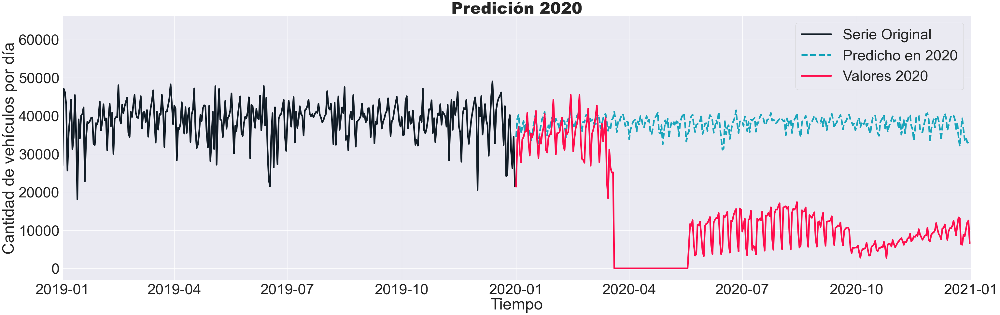

In [103]:
plt.figure(figsize=(50,15));
sns.set(font_scale=4.1)
sns.lineplot(x = serie2020.index[:length_total],y= serie2020[:length_total],lw = 5, label = 'Serie Original', color = c1)
plt.plot(serie2020.index[N_train2020+look_back2020: length_total2020-1], y_test_pred2020,'--', lw = 5, label = 'Predicho en 2020', color=c4)
sns.lineplot(x=df.index, y=df.cantidad_pasos,lw = 5, label = 'Valores 2020', color = c8)
plt.xlim('2019','2021')
plt.legend()
plt.xlabel('Tiempo')
plt.ylabel('Cantidad de vehículos por día')
plt.title ('Predición 2020', fontweight = 'black')
plt.show()

In [104]:
rmse2020 = np.sqrt(mean_squared_error(y_test_pred2020, df.cantidad_pasos[1:]))
r2_2020 = r2_score(y_test_pred2020, df.cantidad_pasos[1:])
print('---------------------------------------------------------------------------------------------------------------------')
print(f'                             Raíz del error cuadrático medio en Test: {rmse2020:0.3f}')
print('---------------------------------------------------------------------------------------------------------------------')

---------------------------------------------------------------------------------------------------------------------
                             Raíz del error cuadrático medio en Test: 27528.514
---------------------------------------------------------------------------------------------------------------------


Podemos observar que al agregar los datos del año 2020, nuestro modelos también empeoran su resultado, observándose el aumento en el RMSE y también modificando el gráfico de tendencia de los datos. Probablemente el año 2020 funcione como un "año de valor atípico" o "año outlier", lo que altera notablemente el resultado de nuestro modelo. Hasta aquí se ven las consecuencias de la pandemia.

# Para investigar y usar los datos en una situación habitual : Vacaciones
Si quiero viajar a Córdoba para las fiestas o para tomarme vacaciones en la 1er semana de Enero ``¿cuál es el mejor día para salir en auto por el peaje Illia hacia Córdoba?``

In [105]:
d = data[(data.estacion == 'Illia') & (data.sentido == 'Provincia')]
d.fecha =  pd.to_datetime(d.fecha,dayfirst = True) + pd.to_timedelta(d.hora_fin, unit = 'h')
d.sort_values('fecha', inplace = True)
d.reset_index(drop=True, inplace = True)
df =d[['fecha','cantidad_pasos']]
df = df.resample('h', on = 'fecha').sum()
df

,cantidad_pasos
fecha,
2017-01-01 00:00:00,961
2017-01-01 01:00:00,242
2017-01-01 02:00:00,951
2017-01-01 03:00:00,1095
2017-01-01 04:00:00,706
...,...
2019-12-31 19:00:00,1225
2019-12-31 20:00:00,1574
2019-12-31 21:00:00,1995


In [106]:
df_2017 = df.loc["2017-12-22":"2018-01-05"]
df_2018 = df.loc["2018-12-22":"2019-01-05"]
df_2019 = df.loc["2019-12-22":"2020-01-05"]

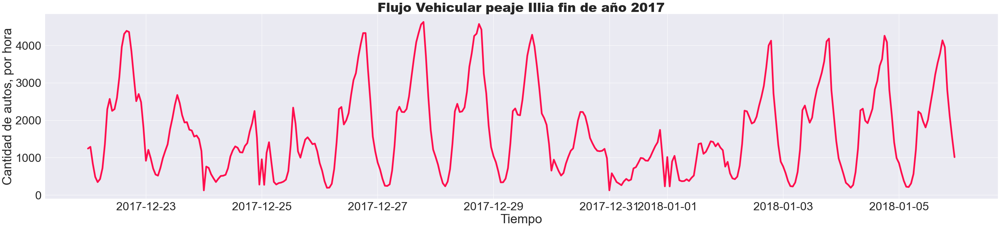

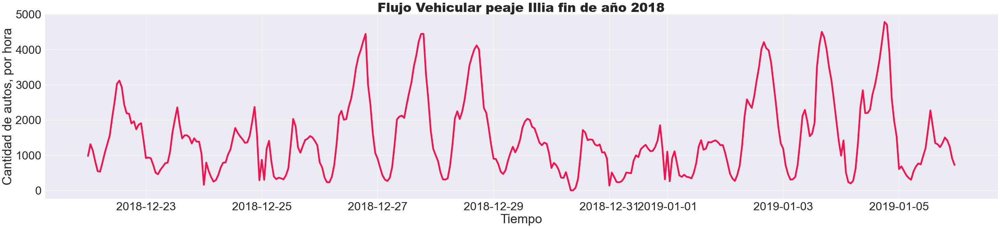

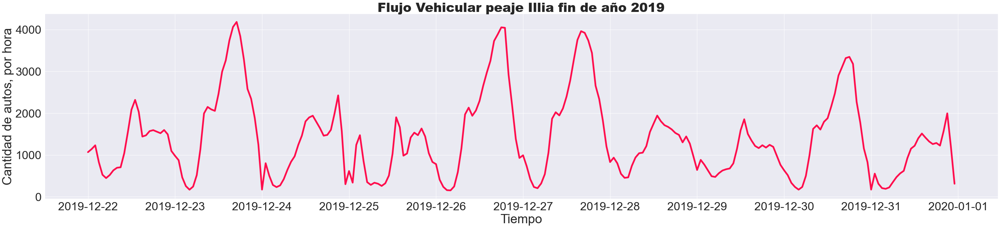

In [107]:
plt.figure(figsize=(50,10));
sns.set(font_scale=3.1)
plt.plot(df_2017.index, df_2017.cantidad_pasos, lw = 5, color=c8)
plt.title ('Flujo Vehicular peaje Illia fin de año 2017', fontweight = 'black')
plt.xlabel('Tiempo')
plt.ylabel('Cantidad de autos, por hora')
plt.show()

plt.figure(figsize=(50,10));
plt.plot(df_2018.index, df_2018.cantidad_pasos, lw = 5, color=c8)
plt.title ('Flujo Vehicular peaje Illia fin de año 2018', fontweight = 'black')
plt.xlabel('Tiempo')
plt.ylabel('Cantidad de autos, por hora')
plt.show()

plt.figure(figsize=(50,10));
plt.plot(df_2019.index, df_2019.cantidad_pasos, lw = 5, color=c8)
plt.title ('Flujo Vehicular peaje Illia fin de año 2019', fontweight = 'black')
plt.xlabel('Tiempo')
plt.ylabel('Cantidad de autos, por hora')
plt.show()

Con el comportamiento de los últimos 3 años, podremos observar que los días de menor circulación con sentido provincia de vehículos livianos es durante el 24 y 25 de Diciembre y el 31 y el 1 de Enero. Probablemente no querramos viajar en esas fechas, ya que vamos a llegar cansados a destino si salimos el 24 o el 31. Es buena idea salir el 25 de Diciembre o el 1 de Enero. Creo que el mejor día para salir en un viaje a Córdoba por el peaje Illia es entre el 29 y el 30 de Diciembre.

# Conclusiones

- Entender estas series de tiempo dependió en gran medida de una búsqueda de los motivos por los cuales las series poseían valores atípicos, debidos a la situación politico-social del país en algunos periodos de tiempos particulares. 


- Las series de tiempo brindan la oportunidad de pronosticar valores futuros, basándose en valores anteriores. Las series de tiempo se pueden utilizar para pronosticar tendencias. Estamos asumiendo algo muy importante: que el futuro se va a comportar como el pasado. Es importante saber que estamos presuponiendo esto a la hora de trabajar con predicciones en series de tiempo. El futuro es incierto y podemos aproximarnos a lo que puede llegar a suceder, ¡pero siempre vamos a tener un componente de sorpresa! En este caso en particular los componentes sorpresas serían la Pandemia y con la Cuarentena implementada en en todo el país y el compromiso por parte del gobierno para usar medios más efectivos como TELEPASE, lo que obviamente haría que los pagos en efectivo fueran casis nulos. Entonces sería interesante poder incorporar estas variables al momento de predecir, es decir, realizar un análisis multivariable.


- En el proximo proyecto se emplearán los métodos tradicionales (``ARIMA, SARIMA y/o SARIMAX``)  y avanzados como ``Prophet`` o ``LSTM``, y ver si mejoran las predicciones para pronosticar los valores de cantidad de autos que pasarán cada día por cada una de las estaciones de peaje.